In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline 
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from sklearn.ensemble import RandomForestClassifier
from math import sqrt
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

In [2]:
#take the dataframe and only present the relevant category
def filter_aggregate_sales(frame, column_to_filter, column_value_to_filter, column_to_aggregate):
    frame = frame[frame[column_to_filter] == column_value_to_filter]
    frame = frame.groupby(column_to_aggregate).sum().T
    return frame

In [3]:
#ETSmodel prediction feature
def ETS_predict(frame, column_to_predict, days_to_predict):
    modelETS = ETSModel(frame.set_index('date')[column_to_predict].iloc[:-days_to_predict]/100, error="add", trend="add", seasonal="add",
                damped_trend=False, seasonal_periods=7)
    fit = modelETS.fit()
    prediction = fit.predict(start= frame.date.min(), end= frame.date.max())
    frame = frame.assign(ETS=prediction.values*100).set_index('date')
    return frame

In [4]:
#Create training/test dataset
def train_test_set(frame, target_feature, start_date, end_date):
    splittedframe = frame[start_date:end_date]
    input_train = splittedframe.drop(target_feature, axis='columns')
    target_train = splittedframe[target_feature]
    return input_train, target_train

In [5]:
#Model and predict data using Random Forest 
def forest(X_train, y_train, X_test):
    model = RandomForestClassifier()
    model.fit(X_train, y_train)
    y_predicted = model.predict(X_test)
    return y_predicted 

In [6]:
#Function to create train/test split and do model and prediction
def split_n_model(frame, target_feature, train_start_date, train_end_date,
                 test_start_date, test_end_date):
    
    X_train, y_train = train_test_set(frame=frame, target_feature = target_feature,
                                      start_date=train_start_date, end_date=train_end_date)
    
    X_test, y_test   = train_test_set(frame=frame, target_feature = target_feature,
                                      start_date=test_start_date, end_date=test_end_date)
    
    y_predicted      = forest(X_train, y_train, X_test)
    
    return y_test, y_predicted

In [7]:
#Cal_features is the features taken from 003-EK-model from cleanmergedframe
sales = pd.read_csv('/Users/user/hts-forecast/volume/data/raw/sales_train_evaluation.csv')
cal_features = pd.read_csv('/Users/user/hts-forecast/volume/data/processed/sales_cal_features.csv')
cal_features.drop('Unnamed: 0', axis='columns', inplace=True)
sales.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0


In [8]:
cal_features.head()

,date,wday,month,event_type_1,week_of_year
0,2011-01-29,1,1,0,4
1,2011-01-30,2,1,0,4
2,2011-01-31,3,1,0,5
3,2011-02-01,4,2,0,5
4,2011-02-02,5,2,0,5


In [95]:
#Takes the top of hierarchical chain (e.g. FOODS) and outputs the actual 
#-sales per day and the predicted sales (for testing in top-down HTS)

def top_of_hierarchy(column_to_filter, column_value_to_filter):
    featureframe = cal_features.copy()
    featureframe.date = pd.to_datetime(featureframe.date)

    featureframe[column_value_to_filter] = filter_aggregate_sales(frame=sales, column_to_filter=column_to_filter,
                                                                  column_value_to_filter=column_value_to_filter,
                                                                  column_to_aggregate=column_to_filter)[column_value_to_filter].values
    
    featureframe['ETS'] = ETS_predict(frame=featureframe, column_to_predict=column_value_to_filter, 
                                      days_to_predict=120)['ETS'].values

    featureframe.set_index('date', inplace=True)

    featureframe_y_test, featureframe_y_predicted = split_n_model(frame=featureframe, target_feature=column_value_to_filter,
                                                    train_start_date='2011-01-29', train_end_date='2016-01-22', 
                                                    test_start_date='2016-01-24', test_end_date='2016-05-22')
    
    return featureframe[column_value_to_filter].values, featureframe_y_predicted


top_of_chain_sales, prediction_for_top_of_chain_sales = top_of_hierarchy(column_to_filter='cat_id',
                                                                         column_value_to_filter='FOODS') 

In [96]:
prediction_for_top_of_chain_sales.shape

(120,)

In [97]:
def topdown_compare_visual(column_to_filter, column_value_to_filter):
    featureframe = cal_features.copy()
    featureframe.date = pd.to_datetime(featureframe.date)

    featureframe[column_value_to_filter] = filter_aggregate_sales(frame=sales, column_to_filter=column_to_filter,
                                                                  column_value_to_filter=column_value_to_filter,
                                                                  column_to_aggregate=column_to_filter)[column_value_to_filter].values
    
    featureframe['ETS'] = ETS_predict(frame=featureframe, column_to_predict=column_value_to_filter, 
                                      days_to_predict=120)['ETS'].values

    featureframe.set_index('date', inplace=True)

    featureframe_y_test, featureframe_y_predicted = split_n_model(frame=featureframe, target_feature=column_value_to_filter,
                                                    train_start_date='2011-01-29', train_end_date='2016-01-22', 
                                                    test_start_date='2016-01-24', test_end_date='2016-05-22')

    print("Average sales for foods items is: ", featureframe_y_test.mean())
    rmse = sqrt(mean_squared_error(featureframe_y_test, featureframe_y_predicted))
    print("Root mean squared error is: ", rmse)
    
    sales_fraction = featureframe[column_value_to_filter][:-120].sum()/top_of_chain_sales[:-120].sum()
    
    print("sales fraction is: ", sales_fraction)
    rmse2 = sqrt(mean_squared_error(featureframe_y_test, prediction_for_top_of_chain_sales*(sales_fraction)))
    print("(top down) Root mean squared error is: ", rmse2)
    print("RMSE ratio between (top-down)HTS:(Random Forest)TS = ", rmse2/rmse)
    
    
    plt.figure(figsize=(15,6))
    plt.plot(featureframe_y_test,'k-.', label='Actual')
    plt.plot(featureframe_y_test.index, featureframe_y_predicted,'b-.', label='ETS prediction')
    plt.plot(featureframe_y_test.index, prediction_for_top_of_chain_sales*(sales_fraction),'r-.', label='Top-Down prediction')
    plt.xlim('2016-01-22', '2016-05-22')
    plt.legend()
    plt.show()
    return 


In [98]:
def topdown_compare_ratio(column_to_filter, column_value_to_filter):
    featureframe = cal_features.copy()
    featureframe.date = pd.to_datetime(featureframe.date)

    featureframe[column_value_to_filter] = filter_aggregate_sales(frame=sales, column_to_filter=column_to_filter,
                                                                  column_value_to_filter=column_value_to_filter,
                                                                  column_to_aggregate=column_to_filter)[column_value_to_filter].values
    
    featureframe['ETS'] = ETS_predict(frame=featureframe, column_to_predict=column_value_to_filter, 
                                      days_to_predict=120)['ETS'].values

    featureframe.set_index('date', inplace=True)

    featureframe_y_test, featureframe_y_predicted = split_n_model(frame=featureframe, target_feature=column_value_to_filter,
                                                    train_start_date='2011-01-29', train_end_date='2016-01-22', 
                                                    test_start_date='2016-01-24', test_end_date='2016-05-22')

    rmse = sqrt(mean_squared_error(featureframe_y_test, featureframe_y_predicted))
    sales_fraction = featureframe[column_value_to_filter][:-120].sum()/top_of_chain_sales[:-120].sum()
    rmse2 = sqrt(mean_squared_error(featureframe_y_test, prediction_for_top_of_chain_sales*(sales_fraction)))
    RMSE_ratio = rmse2/rmse
    # If RMSE_ratio < 1, then top_down HTS out-performs direct random forest modelling 

    return RMSE_ratio 


FOODS_1
Average sales for foods items is:  3216.4416666666666
Root mean squared error is:  851.4642584003942
sales fraction is:  0.11297961362477947
(top down) Root mean squared error is:  661.6944519815595
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7771253407919361


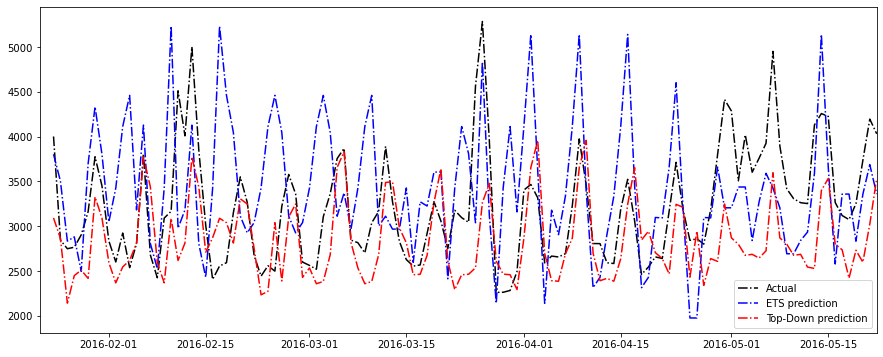

FOODS_2
Average sales for foods items is:  5733.533333333334
Root mean squared error is:  1304.9359243528652
sales fraction is:  0.16712632474401656
(top down) Root mean squared error is:  1726.2816494429321
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.3228861411712747


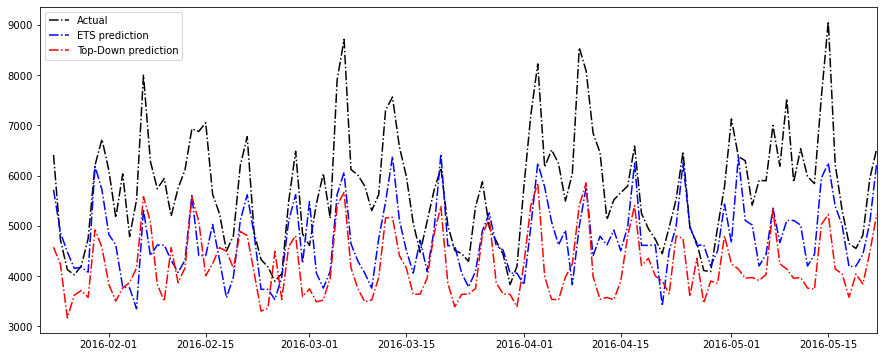

FOODS_3
Average sales for foods items is:  19364.208333333332
Root mean squared error is:  2615.001583810865
sales fraction is:  0.719894061631204
(top down) Root mean squared error is:  2162.038250254334
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8267827689433275


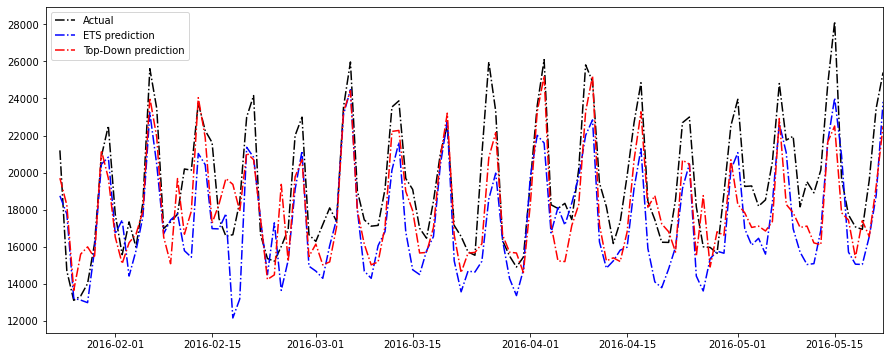

In [86]:
list_of_cats = ['FOODS_1', 'FOODS_2', 'FOODS_3']

for cat in list_of_cats:
    print(cat)
    topdown_compare_visual(column_to_filter = 'dept_id', column_value_to_filter=cat)

In [90]:
sales[sales.item_id == 'FOODS_1_001']

id          FOODS_1_001_CA_1_evaluationFOODS_1_001_CA_2_ev...
item_id     FOODS_1_001FOODS_1_001FOODS_1_001FOODS_1_001FO...
dept_id     FOODS_1FOODS_1FOODS_1FOODS_1FOODS_1FOODS_1FOOD...
cat_id      FOODSFOODSFOODSFOODSFOODSFOODSFOODSFOODSFOODSF...
store_id             CA_1CA_2CA_3CA_4TX_1TX_2TX_3WI_1WI_2WI_3
                                  ...                        
d_1937                                                      7
d_1938                                                      5
d_1939                                                      7
d_1940                                                      5
d_1941                                                      9
Length: 1947, dtype: object

In [121]:
xyz = sales['item_id'].apply(lambda x: (x.split('_')[0]=='FOODS'))
xyz

0        False
1        False
2        False
3        False
4        False
         ...  
30485     True
30486     True
30487     True
30488     True
30489     True
Name: item_id, Length: 30490, dtype: bool

In [185]:
xy = []
for i in range(len(sales[sales.cat_id == 'FOODS'])):
    if (sales.item_id[i].split('_')[0]=='FOODS') and (int(sales.item_id[i].split('_1_')[1])<=100):
        print(items)
    else: 
        continue     

FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOODS_3_827
FOOD

IndexError: list index out of range

In [169]:
sales.item_id[0].split('_')[0]

'HOBBIES'

FOODS_1_001
Average sales for foods items is:  5.725
Root mean squared error is:  5.328383119358692
sales fraction is:  0.00027553382179426204
(top down) Root mean squared error is:  4.074941340808164
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7647613261898125


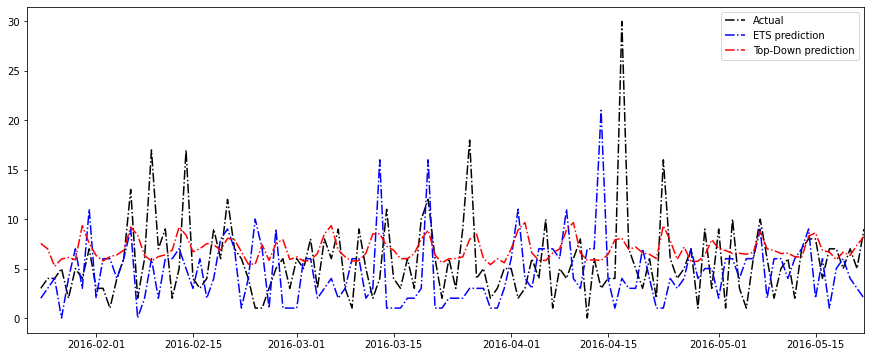

FOODS_1_002
Average sales for foods items is:  4.158333333333333
Root mean squared error is:  2.876629972728505
sales fraction is:  0.00016381058313722193
(top down) Root mean squared error is:  2.398983470317502
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8339562241444798


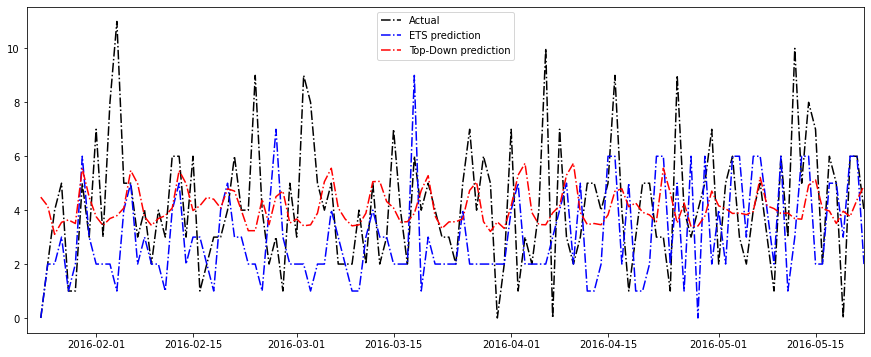

FOODS_1_003
Average sales for foods items is:  5.833333333333333
Root mean squared error is:  4.16132991562393
sales fraction is:  0.0003028355856504657
(top down) Root mean squared error is:  3.4261967242043587
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8233417666166108


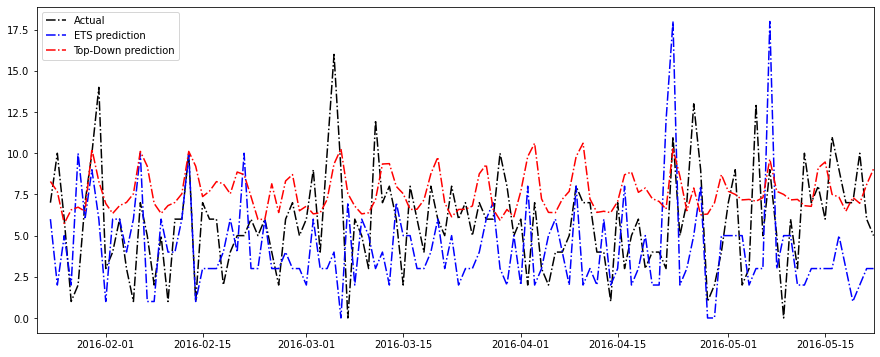

FOODS_1_004
Average sales for foods items is:  31.4
Root mean squared error is:  86.72249804212669
sales fraction is:  0.0030213716843553954
(top down) Root mean squared error is:  66.17074407370346
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7630170436460454


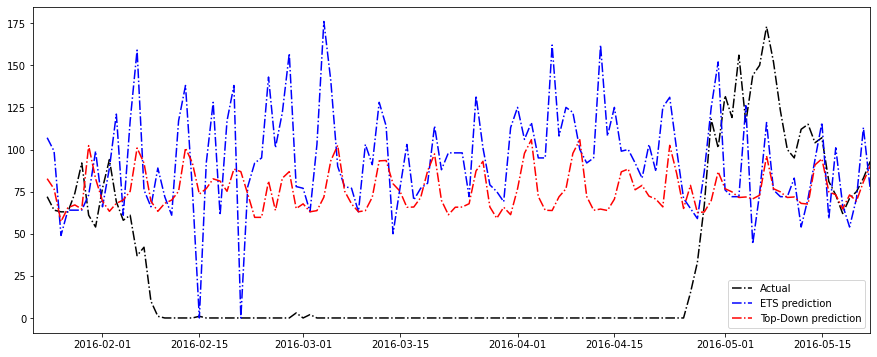

FOODS_1_005
Average sales for foods items is:  19.425
Root mean squared error is:  10.943415067214318
sales fraction is:  0.0004958997383287017
(top down) Root mean squared error is:  10.609841529838265
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.969518332684336


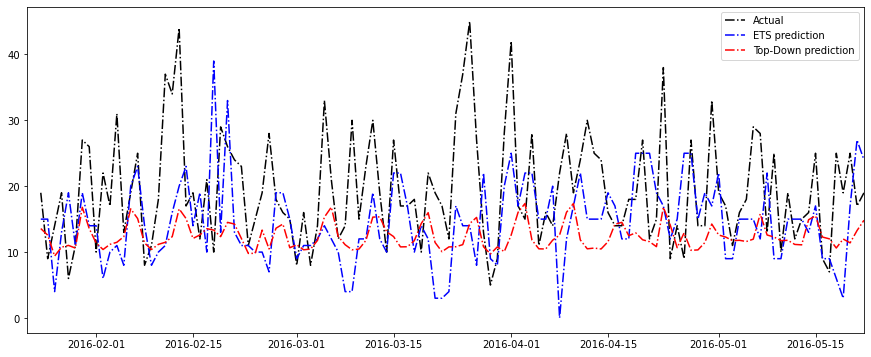

FOODS_1_006
Average sales for foods items is:  11.675
Root mean squared error is:  8.598449472627802
sales fraction is:  0.0004991919406886229
(top down) Root mean squared error is:  7.580192007907832
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8815766182075643


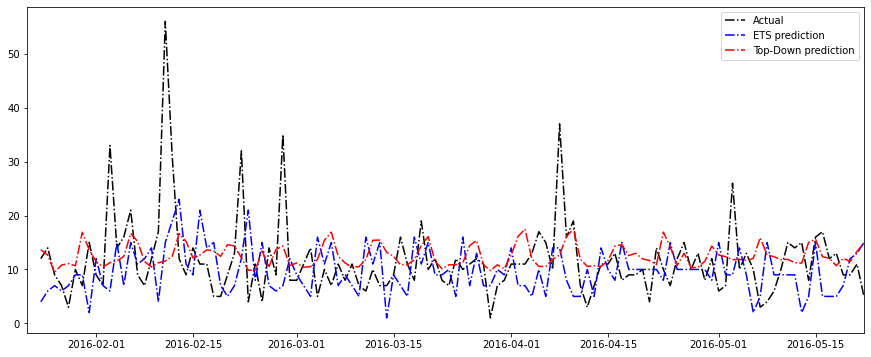

FOODS_1_008
Average sales for foods items is:  2.308333333333333
Root mean squared error is:  2.6879360111431225
sales fraction is:  8.797235020332289e-05
(top down) Root mean squared error is:  1.972274492846729
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7337505374646036


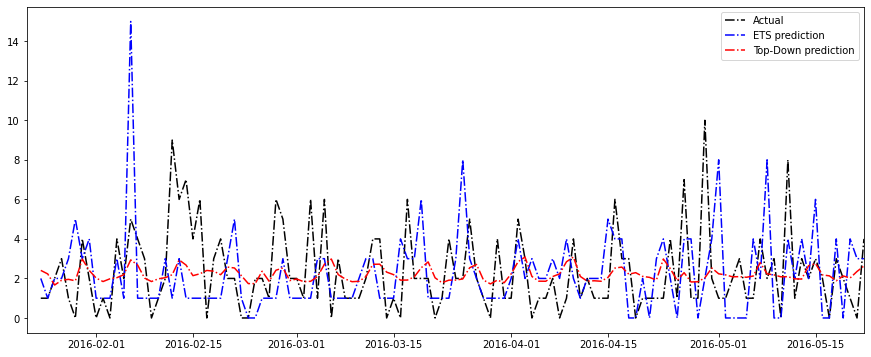

FOODS_1_009
Average sales for foods items is:  3.2416666666666667
Root mean squared error is:  7.013677114514659
sales fraction is:  0.00016538613712375566
(top down) Root mean squared error is:  5.32998922772075
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.759942201600705


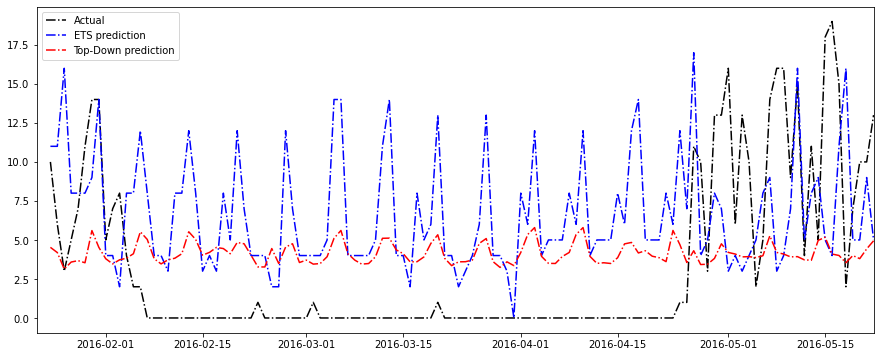

FOODS_1_010
Average sales for foods items is:  5.608333333333333
Root mean squared error is:  4.83045891539648
sales fraction is:  0.00013088855953800996
(top down) Root mean squared error is:  4.290185293813328
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8881527343372908


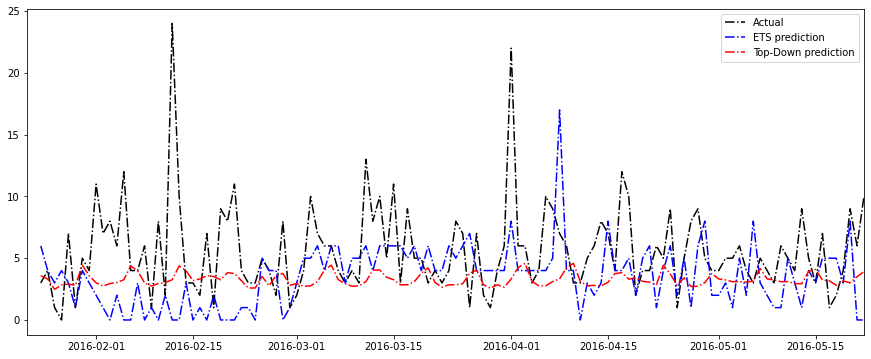

FOODS_1_011
Average sales for foods items is:  9.758333333333333
Root mean squared error is:  7.176350047203662
sales fraction is:  0.000216956135518807
(top down) Root mean squared error is:  6.172258421683478
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8600832430252704


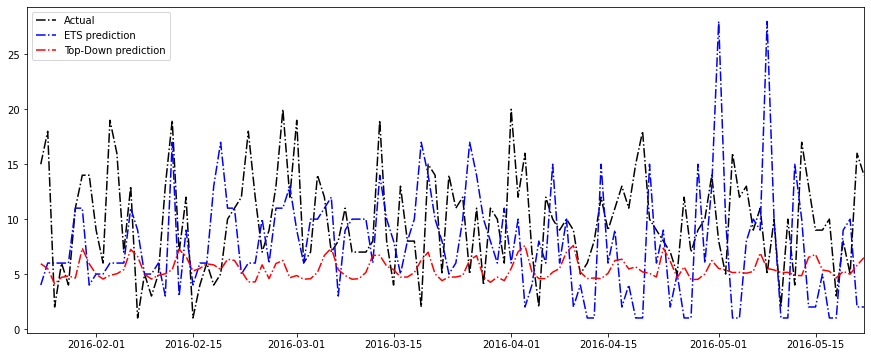

FOODS_1_012
Average sales for foods items is:  56.975
Root mean squared error is:  15.35930771009336
sales fraction is:  0.0018764612822305142
(top down) Root mean squared error is:  18.128659335733406
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1803044562887537


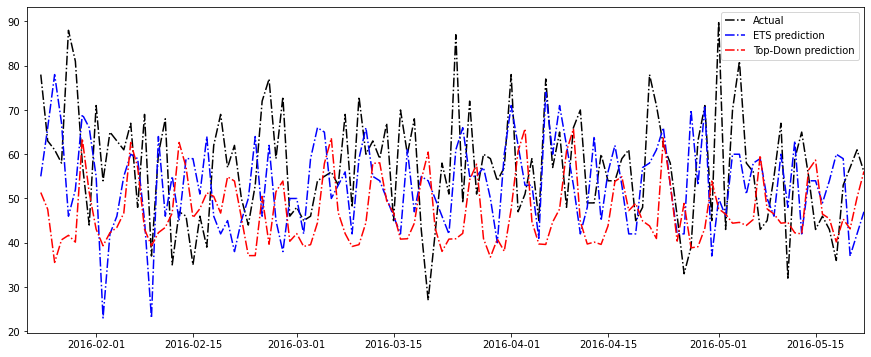

FOODS_1_013
Average sales for foods items is:  15.791666666666666
Root mean squared error is:  11.664047325006875
sales fraction is:  0.0005385572746208235
(top down) Root mean squared error is:  9.69025977850375
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8307802179204583


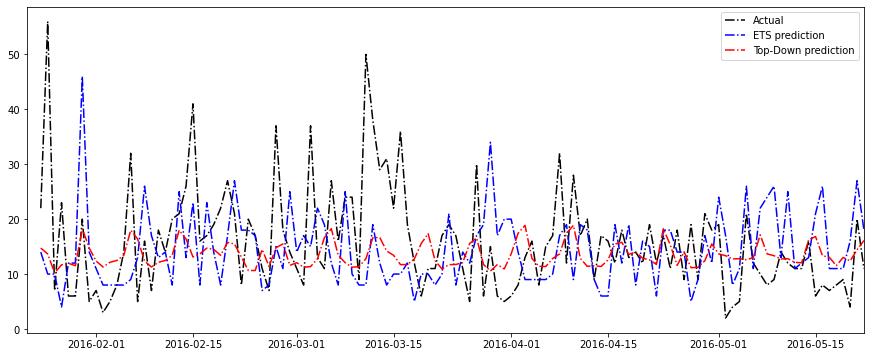

FOODS_1_014
Average sales for foods items is:  11.391666666666667
Root mean squared error is:  7.154252814468701
sales fraction is:  0.00029371148196725554
(top down) Root mean squared error is:  6.7833955709765705
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9481626868508041


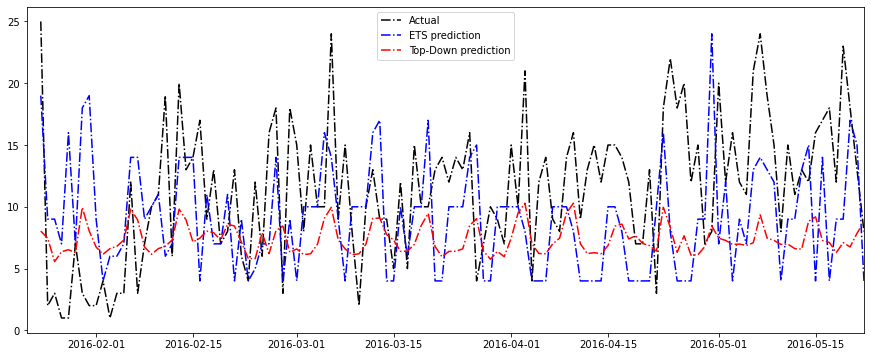

FOODS_1_015
Average sales for foods items is:  7.5
Root mean squared error is:  5.984702721661843
sales fraction is:  0.000278567351111618
(top down) Root mean squared error is:  4.370739100785431
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7303184976866748


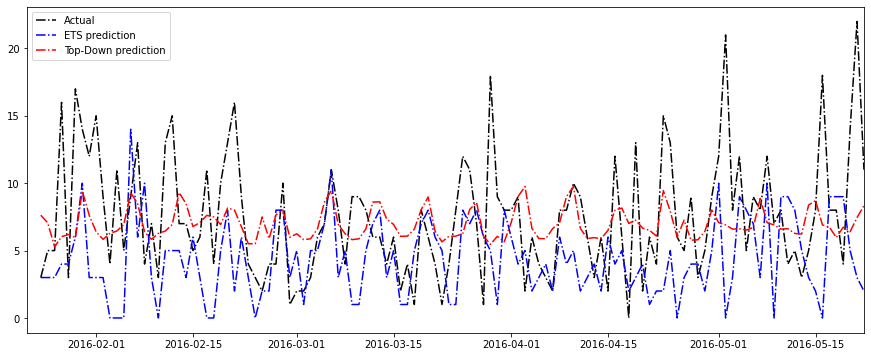

FOODS_1_016
Average sales for foods items is:  6.875
Root mean squared error is:  4.88023223491123
sales fraction is:  0.0003073741217609285
(top down) Root mean squared error is:  3.045690267084233
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6240871582496796


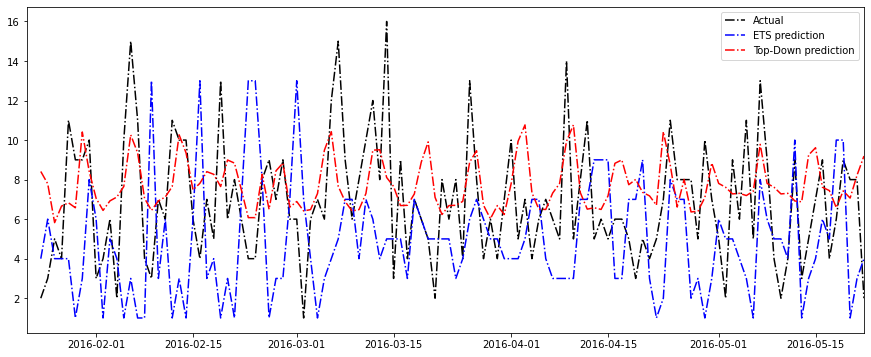

FOODS_1_017
Average sales for foods items is:  8.658333333333333
Root mean squared error is:  7.145511411601925
sales fraction is:  0.0001577670402336523
(top down) Root mean squared error is:  6.247748298576525
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8743598517570439


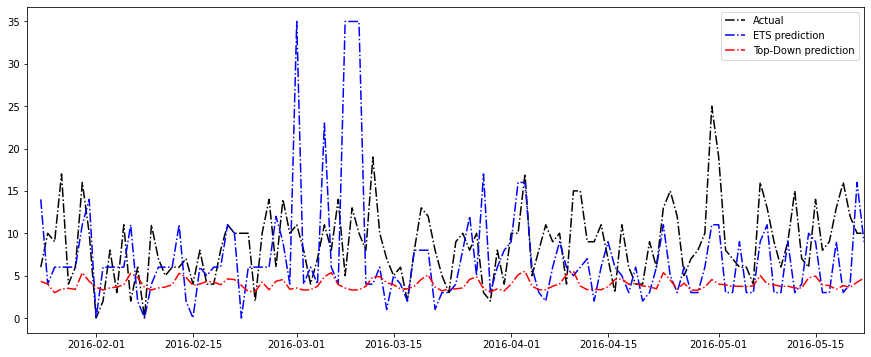

FOODS_1_018
Average sales for foods items is:  104.59166666666667
Root mean squared error is:  30.686587732536616
sales fraction is:  0.002909860087278636
(top down) Root mean squared error is:  40.20243469416627
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.3100979178450693


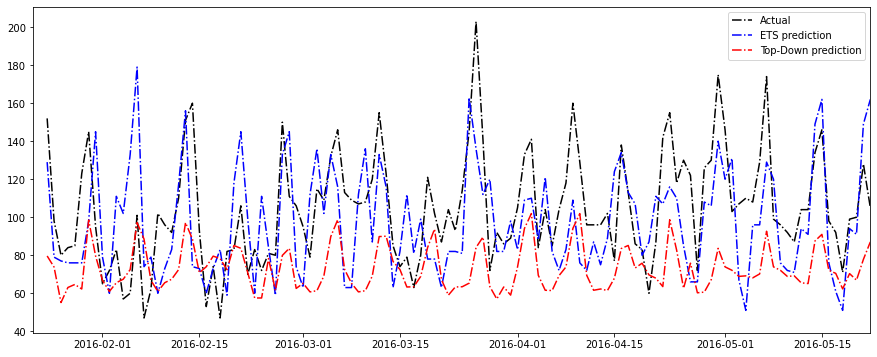

FOODS_1_019
Average sales for foods items is:  52.28333333333333
Root mean squared error is:  27.07505001534315
sales fraction is:  0.0013891212700376076
(top down) Root mean squared error is:  29.120409614090697
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0755440746217813


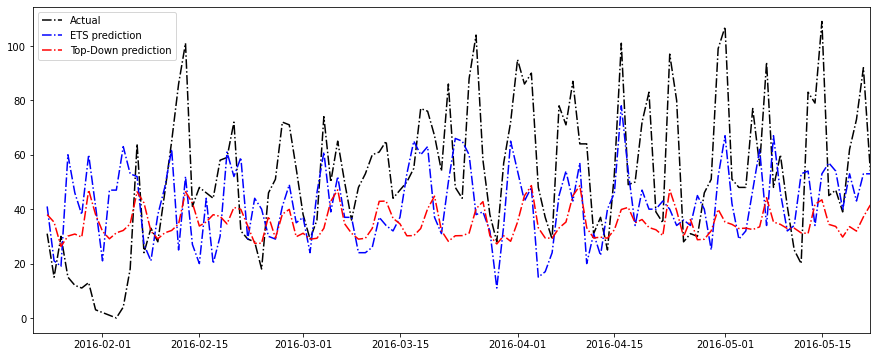

FOODS_1_020
Average sales for foods items is:  10.2
Root mean squared error is:  6.300132273743677
sales fraction is:  0.00037587544657843175
(top down) Root mean squared error is:  4.5969513525749965
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7296594980605681


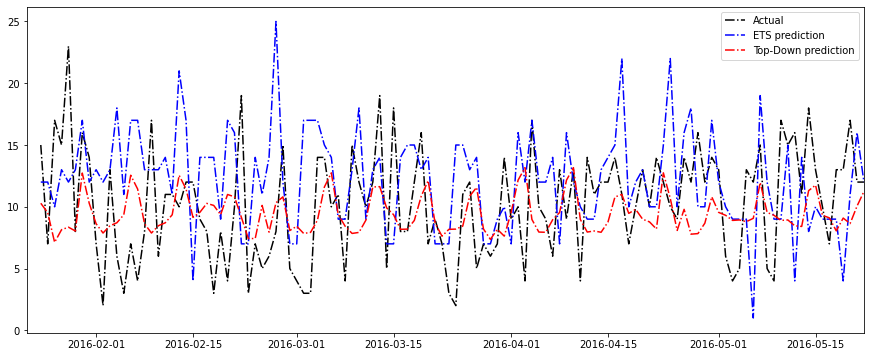

FOODS_1_021
Average sales for foods items is:  12.541666666666666
Root mean squared error is:  11.054033954474116
sales fraction is:  0.0006229552336905177
(top down) Root mean squared error is:  7.227209794893481
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6538074538814195


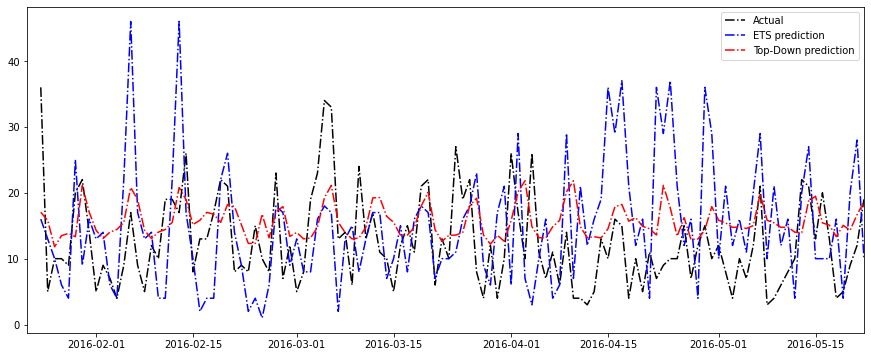

FOODS_1_022
Average sales for foods items is:  2.175
Root mean squared error is:  2.309401076758503
sales fraction is:  6.631436182126986e-05
(top down) Root mean squared error is:  1.7902156008743537
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7751860943042068


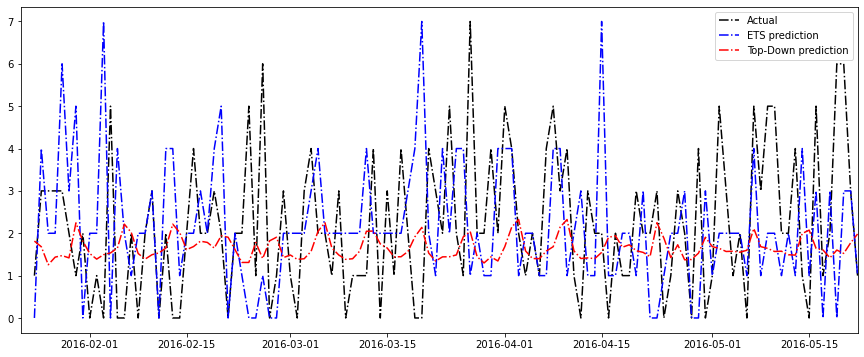

FOODS_1_023
Average sales for foods items is:  24.758333333333333
Root mean squared error is:  9.68977123912978
sales fraction is:  0.0006630025238258449
(top down) Root mean squared error is:  11.480410214919711
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1847968266329005


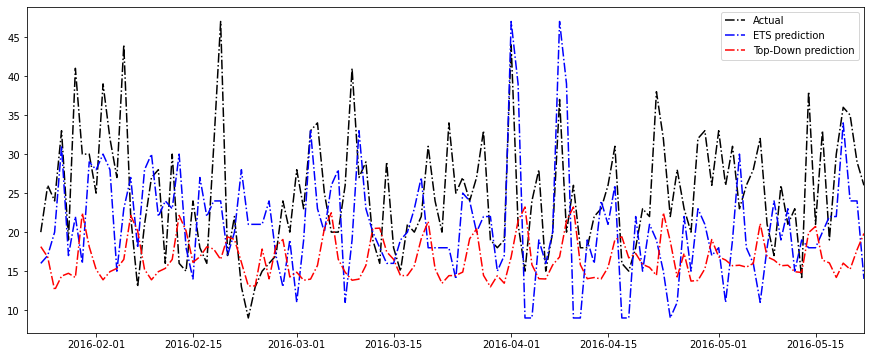

FOODS_1_024
Average sales for foods items is:  10.408333333333333
Root mean squared error is:  7.232450022871457
sales fraction is:  0.00047692254329687023
(top down) Root mean squared error is:  5.050550333944374
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6983180413238699


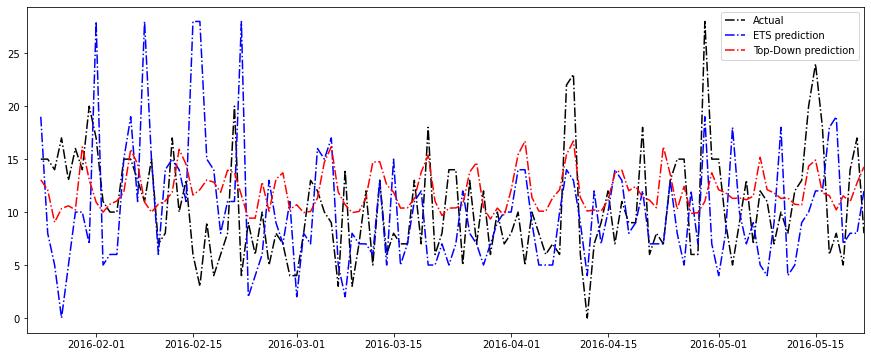

FOODS_1_025
Average sales for foods items is:  6.675
Root mean squared error is:  4.716990566028302
sales fraction is:  0.0002046338924002448
(top down) Root mean squared error is:  3.958588587402091
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8392191020927177


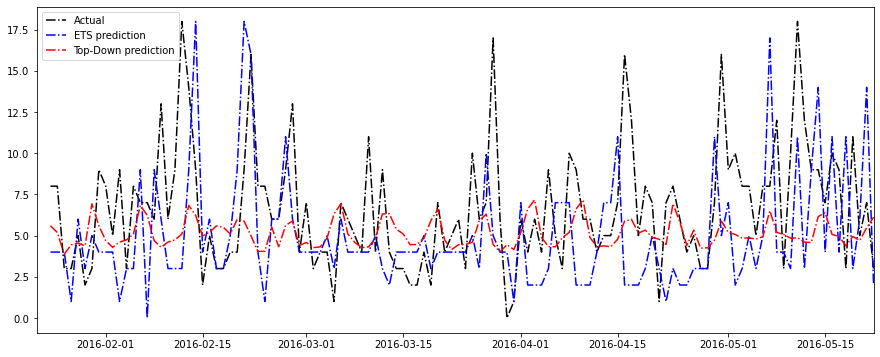

FOODS_1_026
Average sales for foods items is:  2.9833333333333334
Root mean squared error is:  5.090841449767088
sales fraction is:  0.00022057755811472033
(top down) Root mean squared error is:  4.952014474717949
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9727300532890313


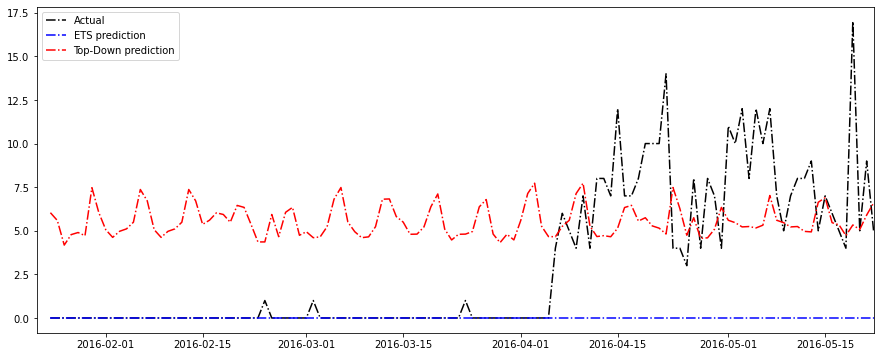

FOODS_1_027
Average sales for foods items is:  23.583333333333332
Root mean squared error is:  10.566850681888777
sales fraction is:  0.0008088470883703539
(top down) Root mean squared error is:  8.86296324615412
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8387516312069155


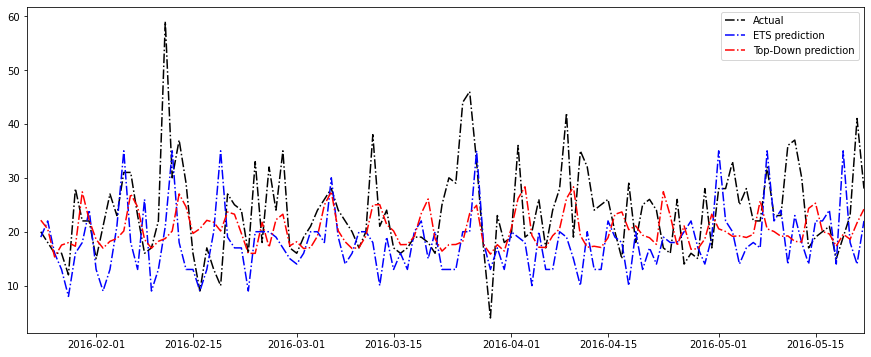

FOODS_1_028
Average sales for foods items is:  11.891666666666667
Root mean squared error is:  8.80198841171698
sales fraction is:  0.0003097962420685848
(top down) Root mean squared error is:  6.459659162404342
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7338863516118028


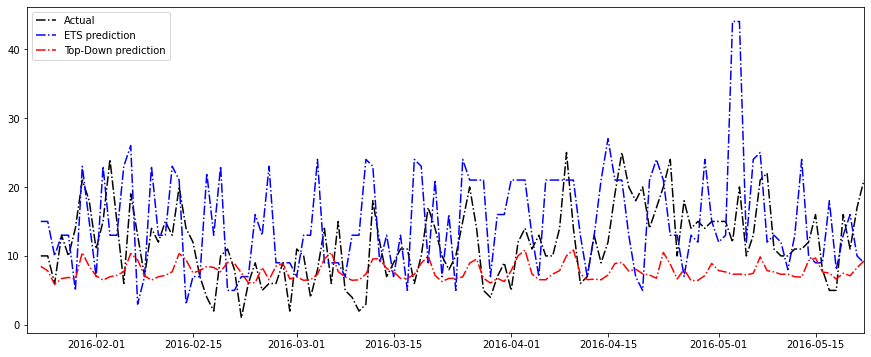

FOODS_1_029
Average sales for foods items is:  2.9916666666666667
Root mean squared error is:  2.7673693886673916
sales fraction is:  0.00010187014730841881
(top down) Root mean squared error is:  2.1548574263520734
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7786663519428936


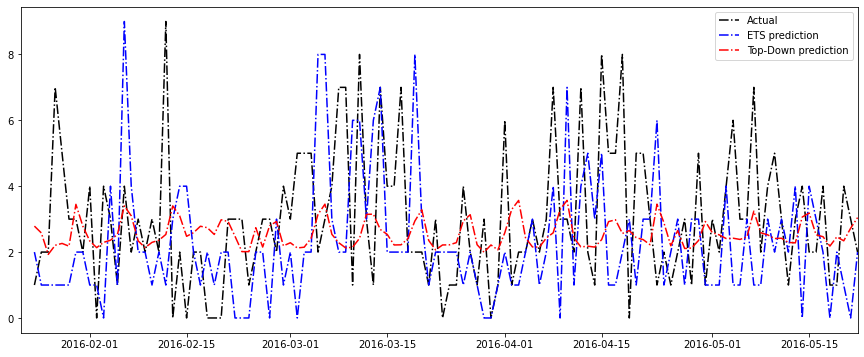

FOODS_1_030
Average sales for foods items is:  4.916666666666667
Root mean squared error is:  3.4229616805723473
sales fraction is:  0.0001692897484933765
(top down) Root mean squared error is:  2.6763791530765584
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7818898961875161


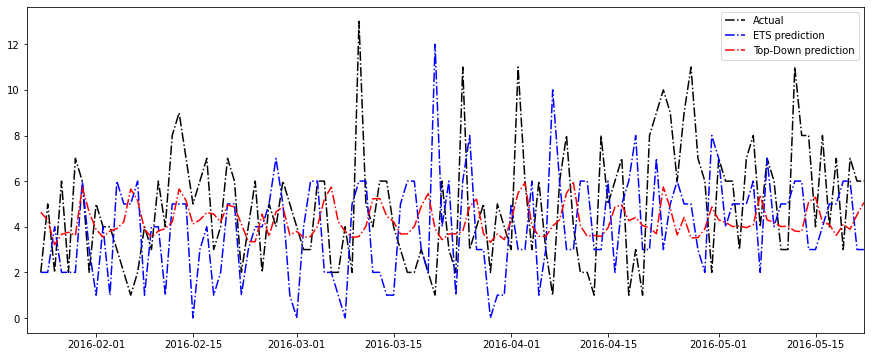

FOODS_1_031
Average sales for foods items is:  13.308333333333334
Root mean squared error is:  7.57572878782409
sales fraction is:  0.0004383567442235076
(top down) Root mean squared error is:  6.175606177680551
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8151831131555485


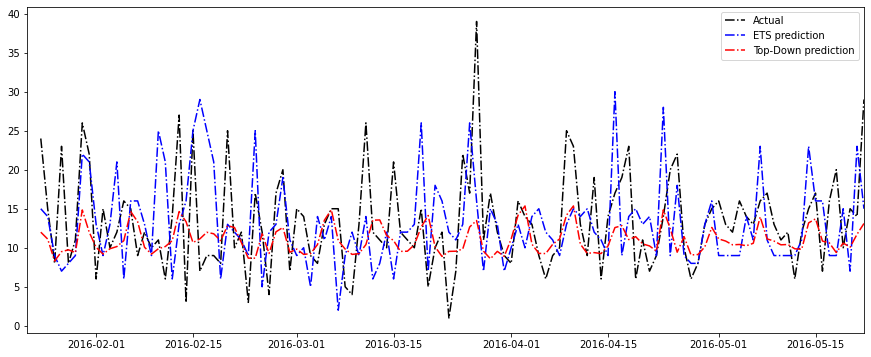

FOODS_1_032
Average sales for foods items is:  69.475
Root mean squared error is:  41.68592888093855
sales fraction is:  0.0028106942490515813
(top down) Root mean squared error is:  23.42820810614818
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.5620171778602502


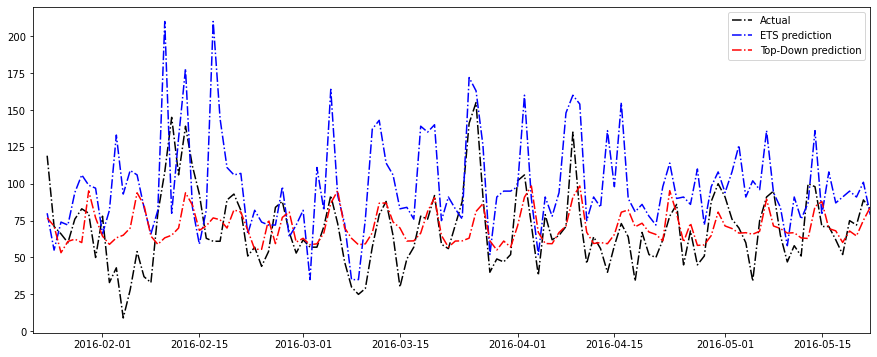

FOODS_1_033
Average sales for foods items is:  2.1166666666666667
Root mean squared error is:  2.4083189157584592
sales fraction is:  5.700213228892133e-05
(top down) Root mean squared error is:  2.095883261311722
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8702681557652672


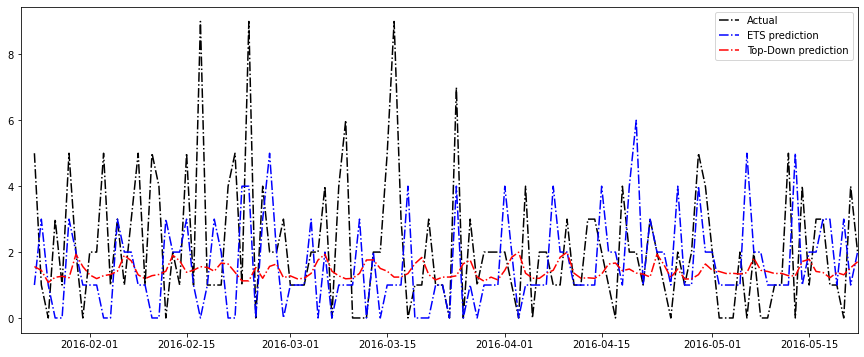

FOODS_1_034
Average sales for foods items is:  6.908333333333333
Root mean squared error is:  5.106368572674715
sales fraction is:  0.0001331695854588125
(top down) Root mean squared error is:  4.44453571163437
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8703906990611772


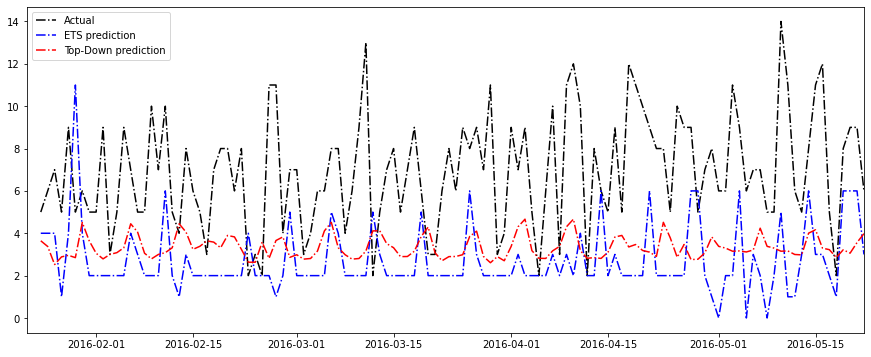

FOODS_1_035
Average sales for foods items is:  10.775
Root mean squared error is:  8.21127273935046
sales fraction is:  0.0001865502951518205
(top down) Root mean squared error is:  8.065482162086425
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9822450694439403


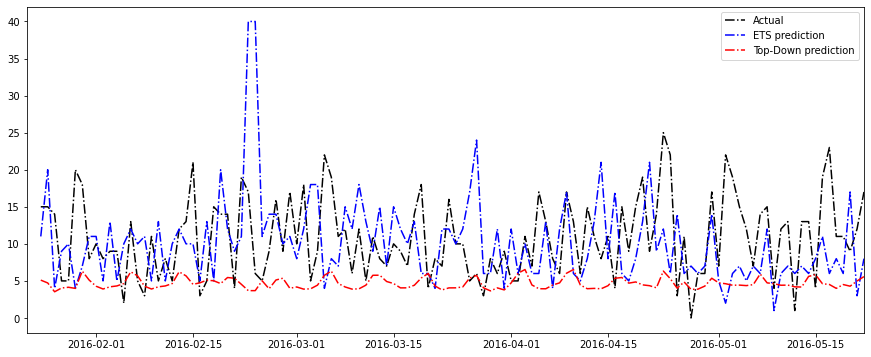

FOODS_1_036
Average sales for foods items is:  15.725
Root mean squared error is:  9.890652152411388
sales fraction is:  0.0005607090933568647
(top down) Root mean squared error is:  6.459943221899927
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6531362262421656


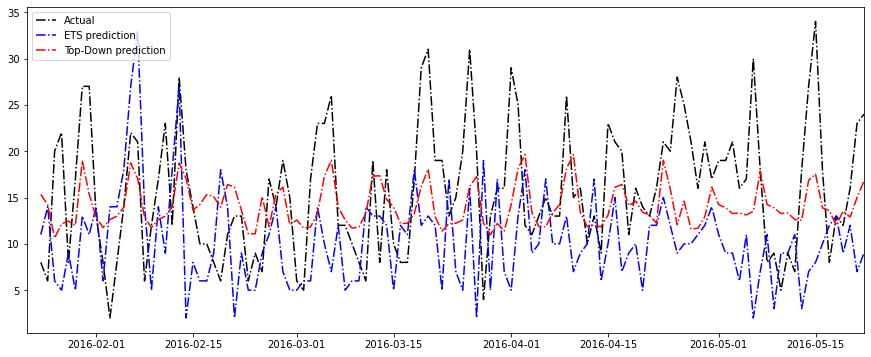

FOODS_1_037
Average sales for foods items is:  11.408333333333333
Root mean squared error is:  7.785670598392065
sales fraction is:  0.00039351224493515245
(top down) Root mean squared error is:  6.046972953462715
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7766797833331872


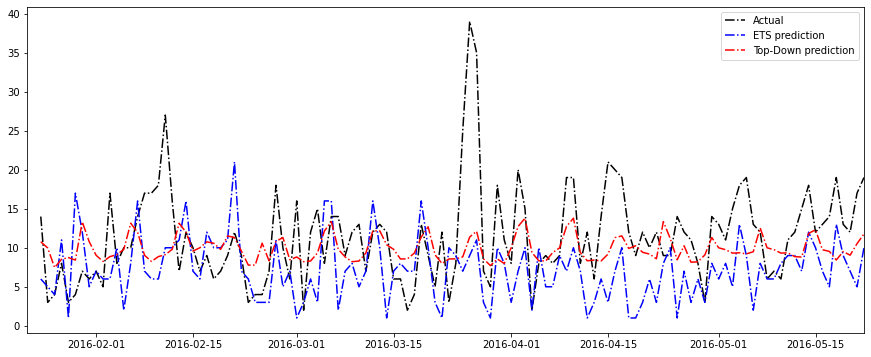

FOODS_1_038
Average sales for foods items is:  5.566666666666666
Root mean squared error is:  5.802298395176403
sales fraction is:  0.0002736995947651631
(top down) Root mean squared error is:  3.5505399762803753
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.611919576427167


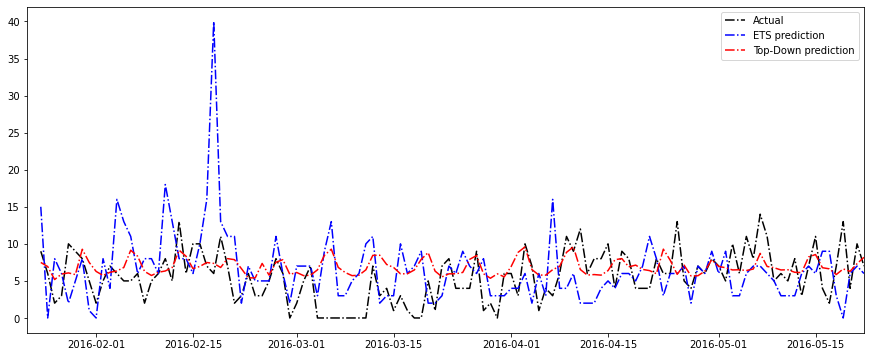

FOODS_1_039
Average sales for foods items is:  3.4
Root mean squared error is:  3.872983346207417
sales fraction is:  0.00010165850572813815
(top down) Root mean squared error is:  3.357625261863052
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8669351148000612


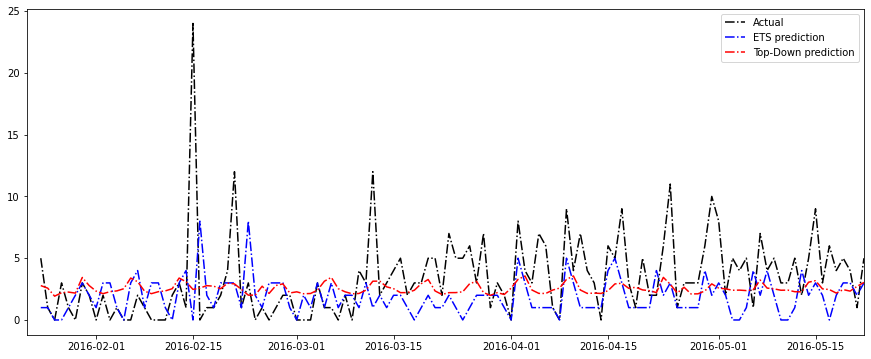

FOODS_1_040
Average sales for foods items is:  13.283333333333333
Root mean squared error is:  6.564424321040397
sales fraction is:  0.000583025522210902
(top down) Root mean squared error is:  5.432411063237245
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8275533081895994


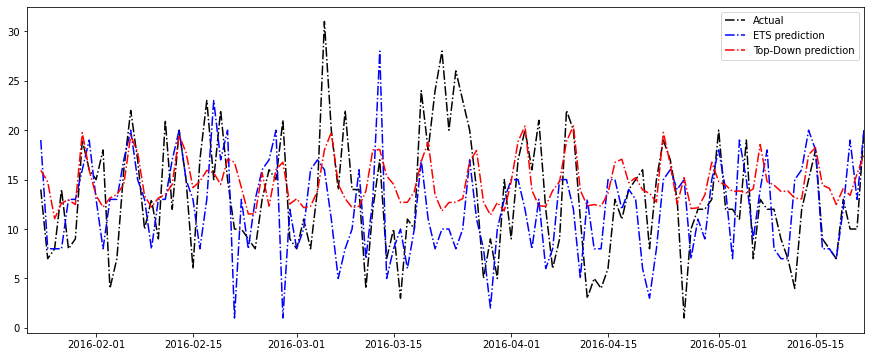

FOODS_1_041
Average sales for foods items is:  8.725
Root mean squared error is:  5.80086200490927
sales fraction is:  0.00032646889544847145
(top down) Root mean squared error is:  3.819056459629314
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6583601637820804


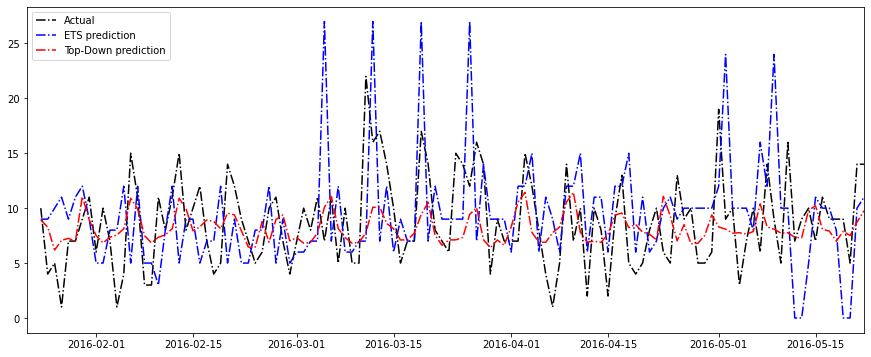

FOODS_1_042
Average sales for foods items is:  36.15
Root mean squared error is:  15.605020559636142
sales fraction is:  0.0010087778345421398
(top down) Root mean squared error is:  16.56024095316251
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0612123764833181


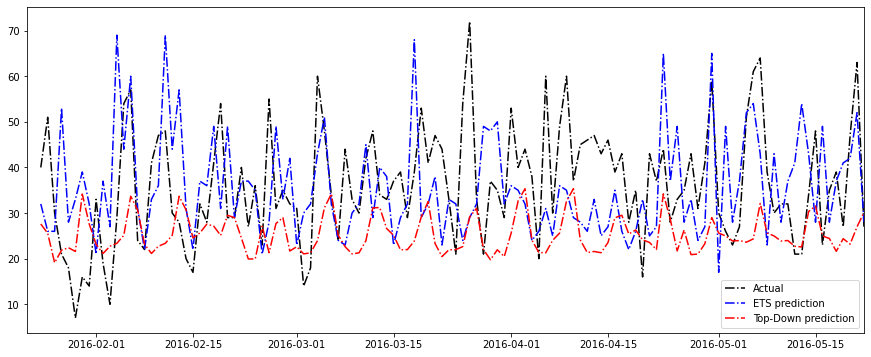

FOODS_1_043
Average sales for foods items is:  35.666666666666664
Root mean squared error is:  72.2884269206812
sales fraction is:  0.0030086026423451298
(top down) Root mean squared error is:  68.30526469106864
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9448990329533232


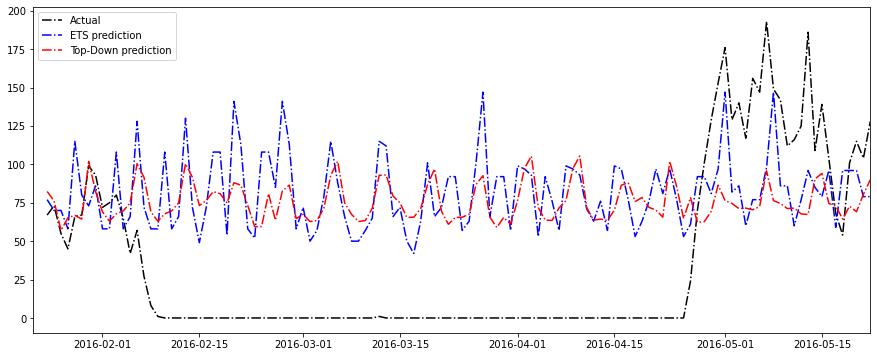

FOODS_1_044
Average sales for foods items is:  11.066666666666666
Root mean squared error is:  8.371578903249572
sales fraction is:  0.0006417913343354954
(top down) Root mean squared error is:  6.663689142648635
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7959895283387951


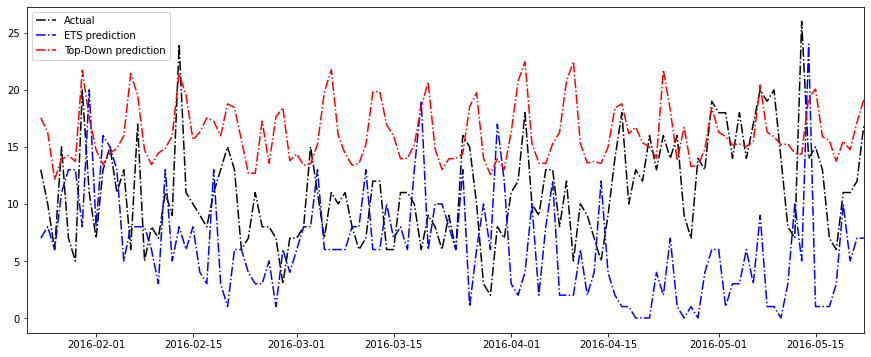

FOODS_1_045
Average sales for foods items is:  13.916666666666666
Root mean squared error is:  8.175675303402567
sales fraction is:  0.0006370646723758942
(top down) Root mean squared error is:  6.947785720253587
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8498118458009267


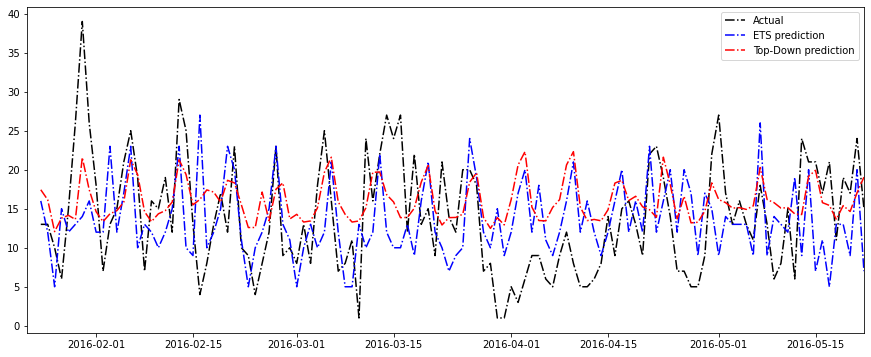

FOODS_1_046
Average sales for foods items is:  57.141666666666666
Root mean squared error is:  27.360860122932294
sales fraction is:  0.0028453329210241804
(top down) Root mean squared error is:  22.69001905377589
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8292874913957266


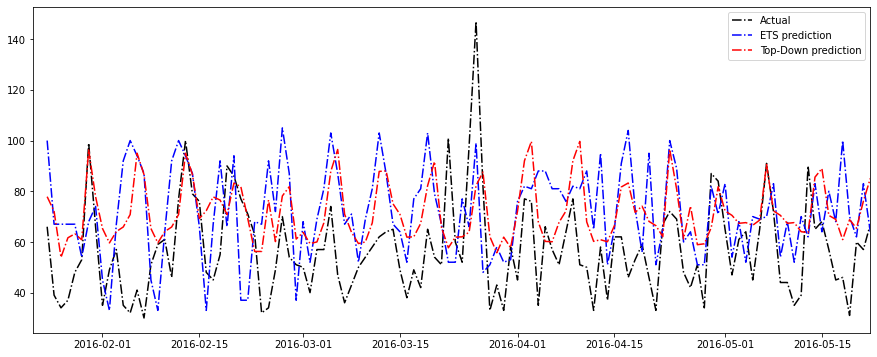

FOODS_1_047
Average sales for foods items is:  10.883333333333333
Root mean squared error is:  6.539622822966678
sales fraction is:  0.000439744172360903
(top down) Root mean squared error is:  5.027091895284025
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7687128189762329


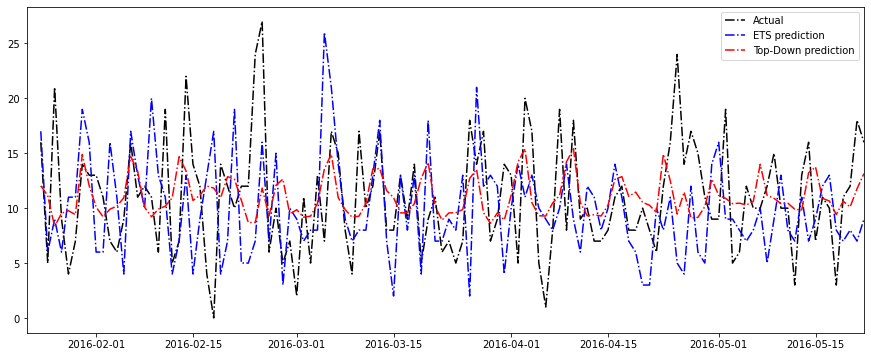

FOODS_1_048
Average sales for foods items is:  5.8
Root mean squared error is:  3.664014192112252
sales fraction is:  0.0001762739206426379
(top down) Root mean squared error is:  3.3732623942142297
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9206466507351577


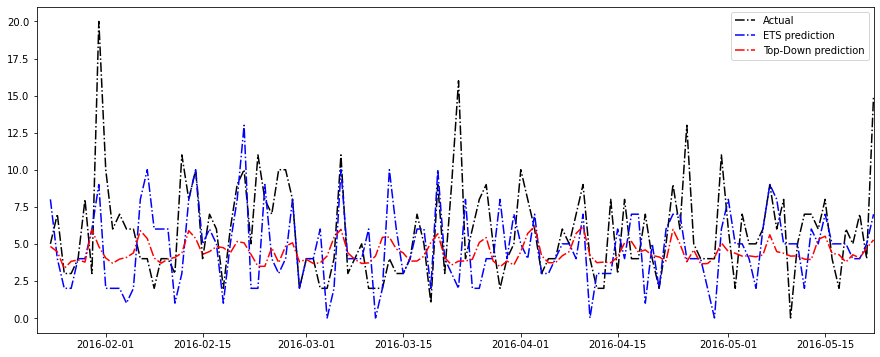

FOODS_1_049
Average sales for foods items is:  5.55
Root mean squared error is:  6.616267830129007
sales fraction is:  0.0002642227551148185
(top down) Root mean squared error is:  4.71289508076733
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7123192714940979


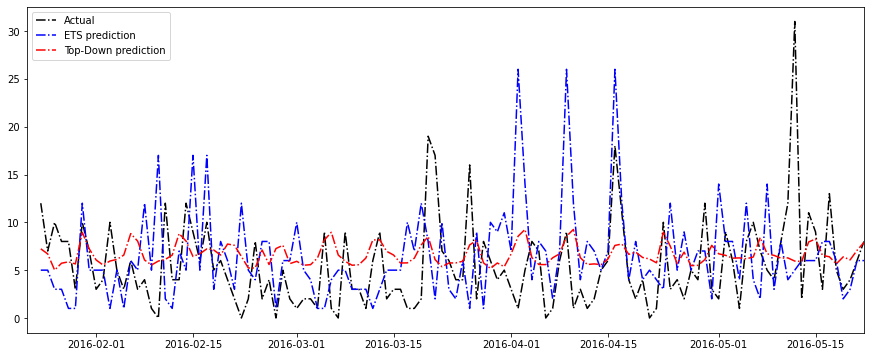

FOODS_1_050
Average sales for foods items is:  5.108333333333333
Root mean squared error is:  4.039389392800187
sales fraction is:  0.00010843103629711891
(top down) Root mean squared error is:  3.879661324908015
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9604573730433438


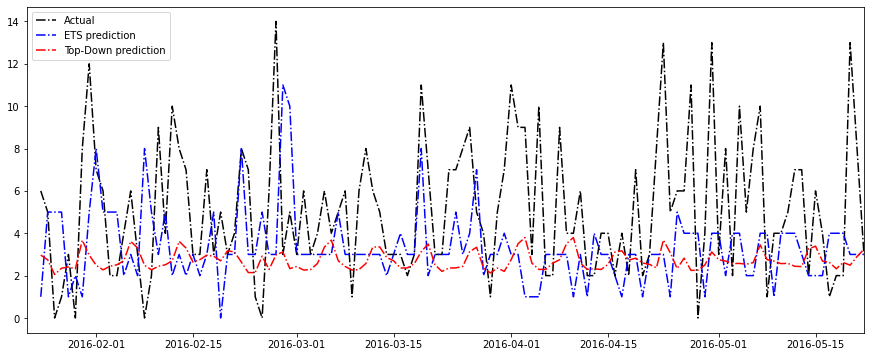

FOODS_1_051
Average sales for foods items is:  13.15
Root mean squared error is:  6.099863386448367
sales fraction is:  0.0002688318384187082
(top down) Root mean squared error is:  7.981404054243776
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.308456197883955


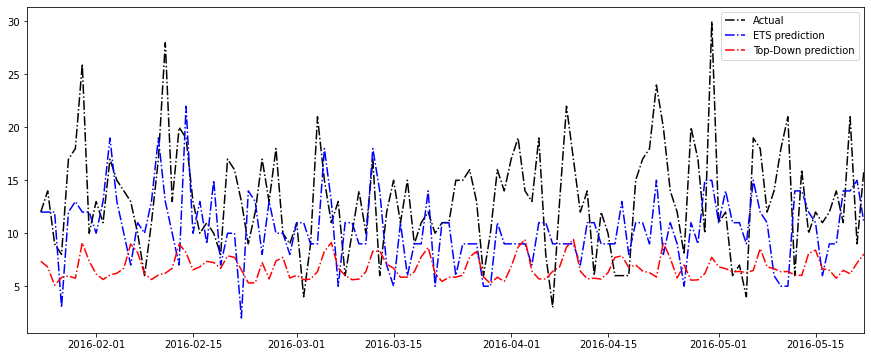

FOODS_1_052
Average sales for foods items is:  10.283333333333333
Root mean squared error is:  6.719995039680708
sales fraction is:  0.00028167142762240086
(top down) Root mean squared error is:  6.0125615709065015
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8947270846783513


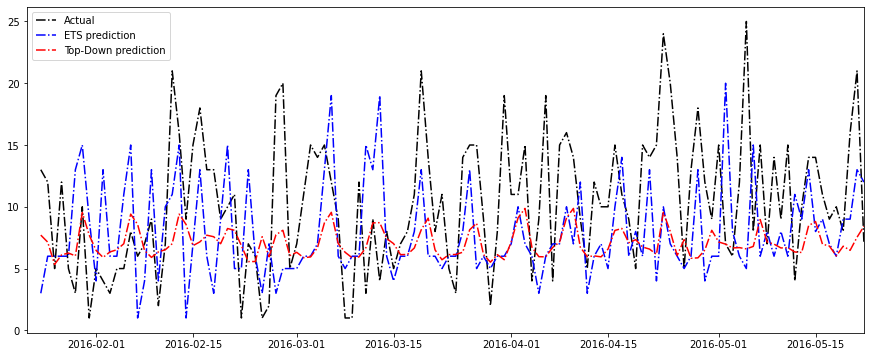

FOODS_1_053
Average sales for foods items is:  4.058333333333334
Root mean squared error is:  2.8298998804433584
sales fraction is:  0.00016442199214692158
(top down) Root mean squared error is:  2.3929696504401536
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8456022303040801


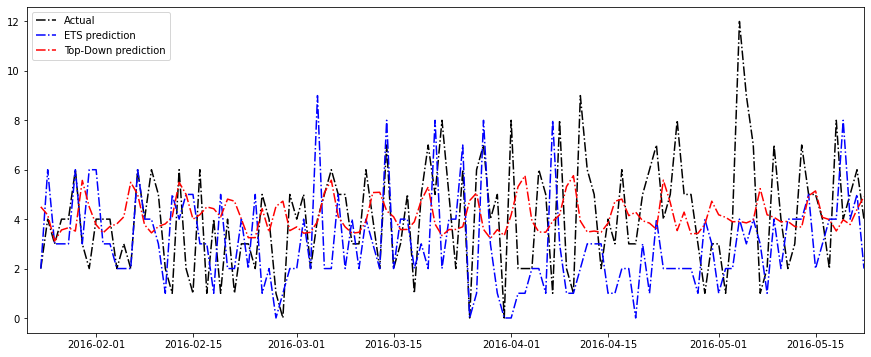

FOODS_1_054
Average sales for foods items is:  11.125
Root mean squared error is:  6.731146509572744
sales fraction is:  0.0005096564410469439
(top down) Root mean squared error is:  5.291337077354617
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7860974456327028


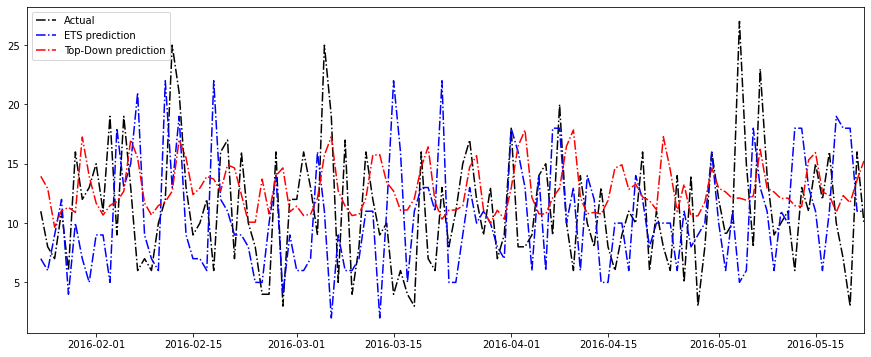

FOODS_1_055
Average sales for foods items is:  37.05833333333333
Root mean squared error is:  53.52577260846716
sales fraction is:  0.001262677183685491
(top down) Root mean squared error is:  38.4619711217126
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7185691910148787


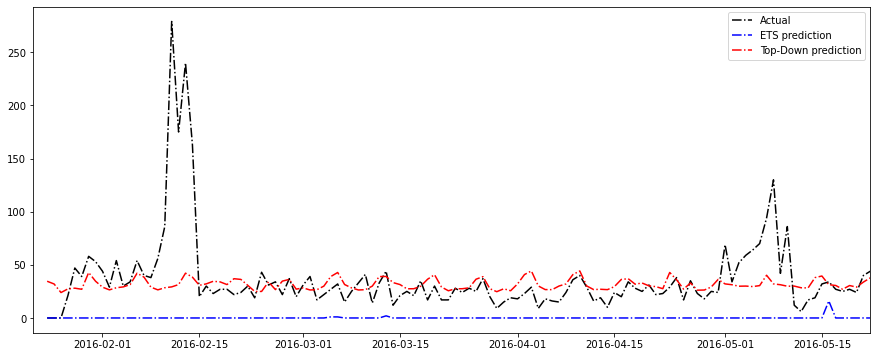

FOODS_1_056
Average sales for foods items is:  1.9666666666666666
Root mean squared error is:  5.138903903881968
sales fraction is:  7.082938220059036e-05
(top down) Root mean squared error is:  3.336752025841438
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6493120105477803


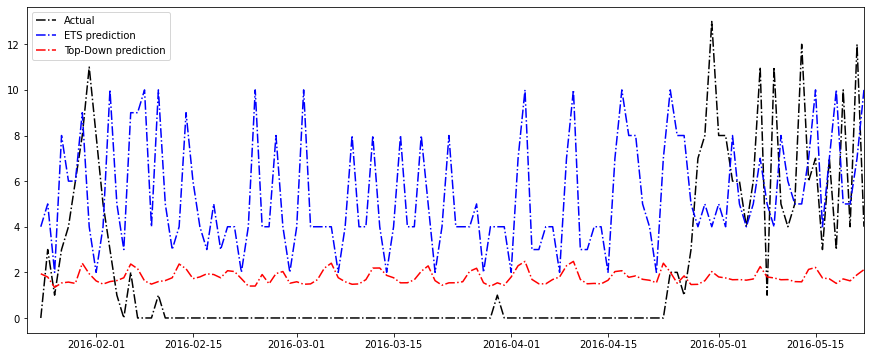

FOODS_1_057
Average sales for foods items is:  2.4
Root mean squared error is:  4.7993055053135905
sales fraction is:  8.613812317422393e-05
(top down) Root mean squared error is:  3.8156006115204306
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7950318243537439


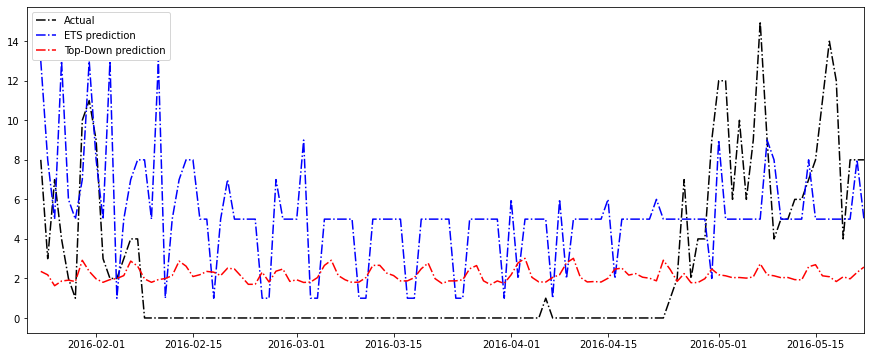

FOODS_1_058
Average sales for foods items is:  11.416666666666666
Root mean squared error is:  33.262466334694224
sales fraction is:  0.0012626536679543488
(top down) Root mean squared error is:  27.198449047949058
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8176918925455589


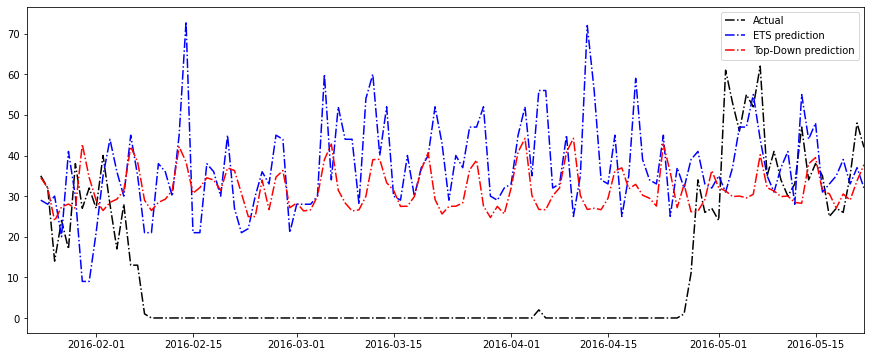

FOODS_1_059
Average sales for foods items is:  13.483333333333333
Root mean squared error is:  6.365924913160694
sales fraction is:  0.00021886090974133283
(top down) Root mean squared error is:  9.705343869269921
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.5245771826817227


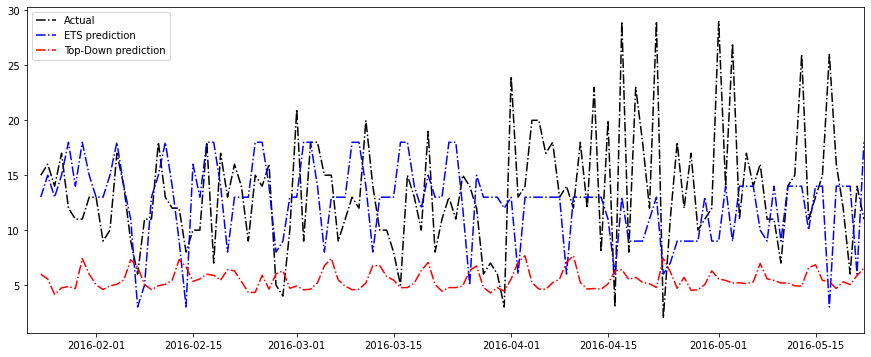

FOODS_1_060
Average sales for foods items is:  5.508333333333334
Root mean squared error is:  4.354116825871044
sales fraction is:  6.622029889670068e-05
(top down) Root mean squared error is:  5.196574003715025
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1934852029780911


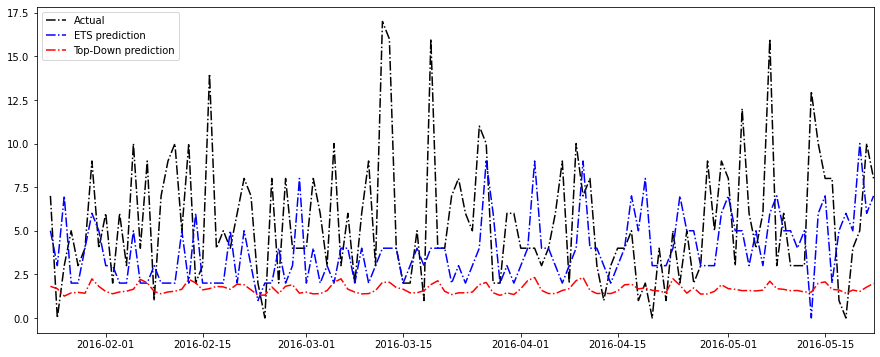

FOODS_1_061
Average sales for foods items is:  18.666666666666668
Root mean squared error is:  8.06484139129014
sales fraction is:  0.0009079894108662667
(top down) Root mean squared error is:  7.428505285092287
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9210975051679153


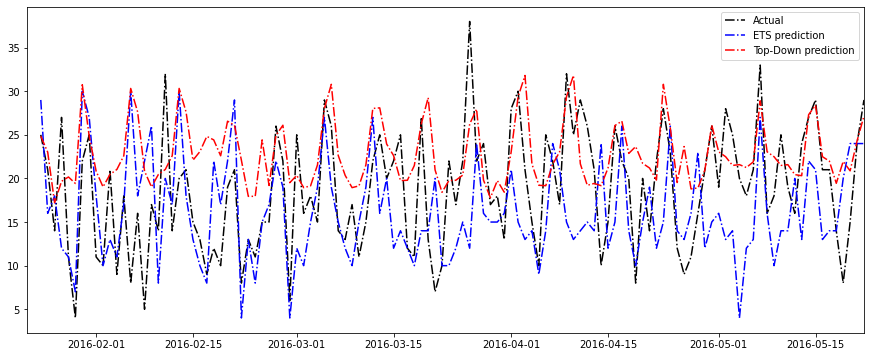

FOODS_1_062
Average sales for foods items is:  7.5
Root mean squared error is:  6.798284097231202
sales fraction is:  0.00023645067663576895
(top down) Root mean squared error is:  5.756148062942661
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8467060188448169


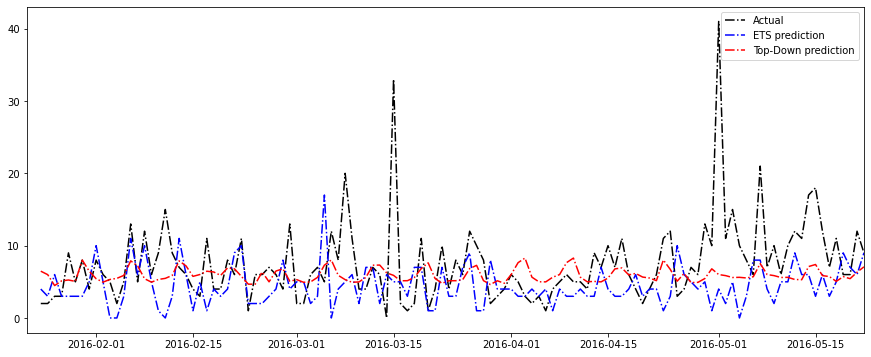

FOODS_1_063
Average sales for foods items is:  9.883333333333333
Root mean squared error is:  6.58027355054484
sales fraction is:  0.0004161108625628972
(top down) Root mean squared error is:  4.969400558049592
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7551966525218591


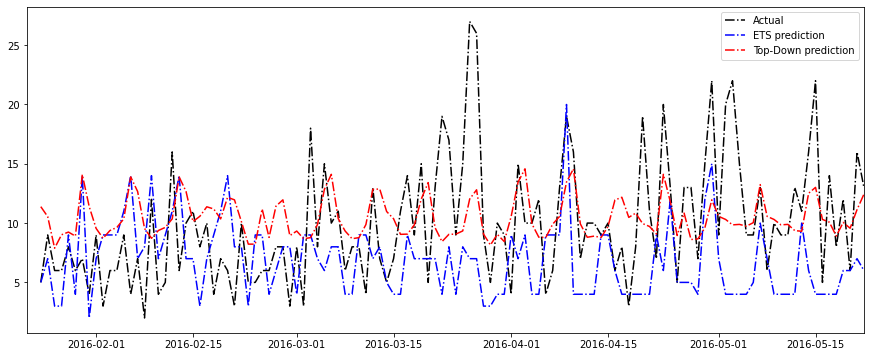

FOODS_1_064
Average sales for foods items is:  4.925
Root mean squared error is:  4.053804797142227
sales fraction is:  0.00025792053916868363
(top down) Root mean squared error is:  3.38647498105628
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.83538185742037


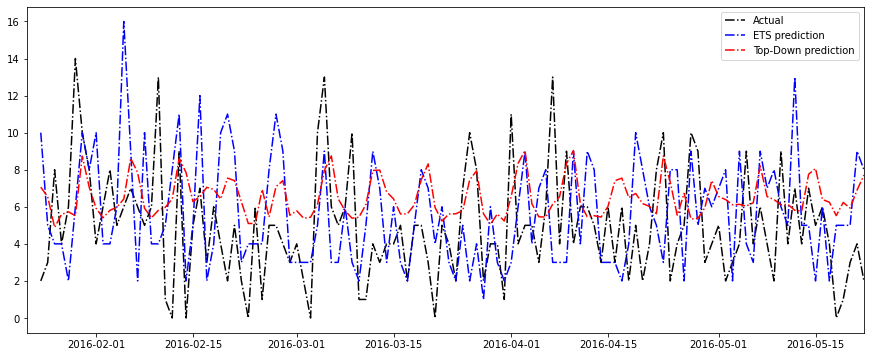

FOODS_1_065
Average sales for foods items is:  8.741666666666667
Root mean squared error is:  5.585696017507576
sales fraction is:  0.00025222973223224844
(top down) Root mean squared error is:  4.609586074444688
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8252482877687204


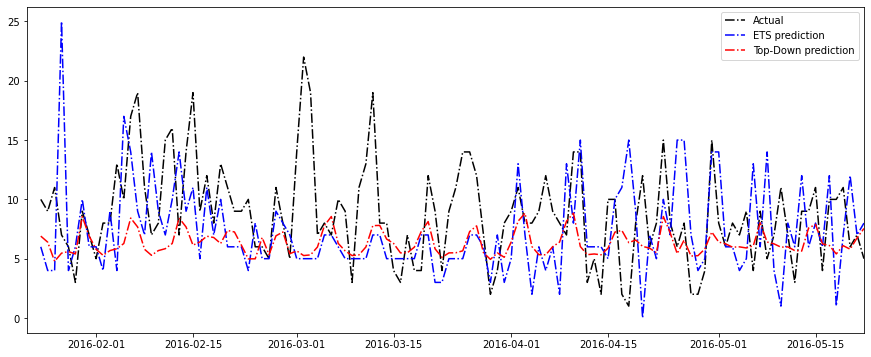

FOODS_1_066
Average sales for foods items is:  9.675
Root mean squared error is:  5.766281297335398
sales fraction is:  0.0003725126970250836
(top down) Root mean squared error is:  4.638655760111359
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8044449309566087


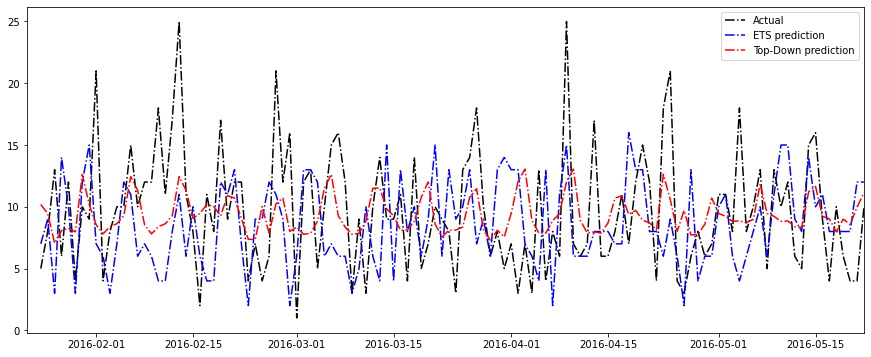

FOODS_1_067
Average sales for foods items is:  24.491666666666667
Root mean squared error is:  20.764151800639485
sales fraction is:  0.0011816890056314297
(top down) Root mean squared error is:  11.8518210226176
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.5707828153256225


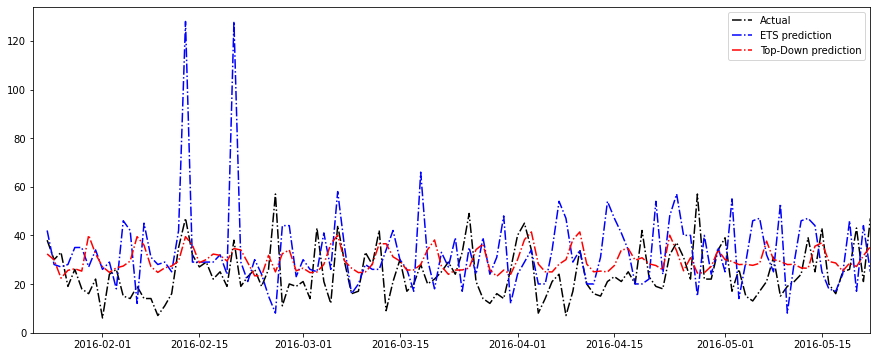

FOODS_1_068
Average sales for foods items is:  2.0416666666666665
Root mean squared error is:  2.7628487713469467
sales fraction is:  0.00011271089936501647
(top down) Root mean squared error is:  1.7641595246863762
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6385291670619784


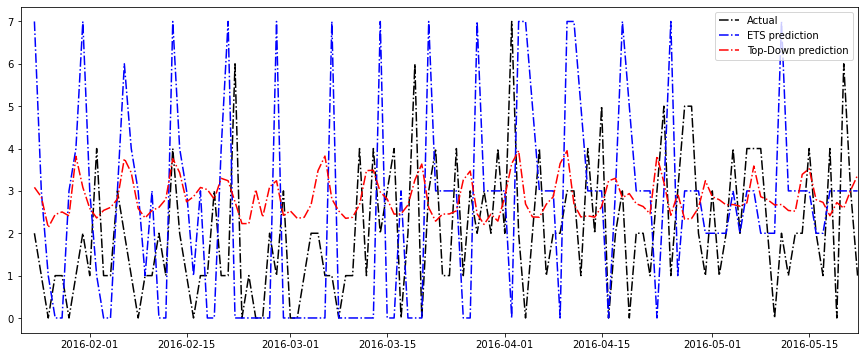

FOODS_1_069
Average sales for foods items is:  16.166666666666668
Root mean squared error is:  10.3400515794974
sales fraction is:  0.00036581071364952977
(top down) Root mean squared error is:  10.673935212660204
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0322903256909124


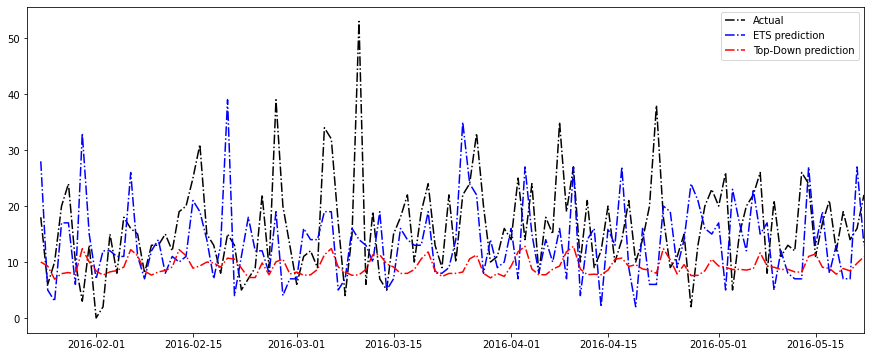

FOODS_1_070
Average sales for foods items is:  8.558333333333334
Root mean squared error is:  5.96168320750664
sales fraction is:  0.00018979546604945712
(top down) Root mean squared error is:  6.045592941544014
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0140748394567023


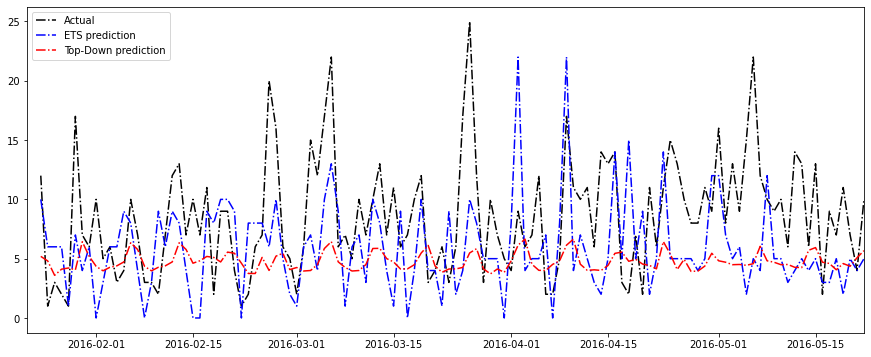

FOODS_1_071
Average sales for foods items is:  11.666666666666666
Root mean squared error is:  8.277479487541282
sales fraction is:  0.000218555205236483
(top down) Root mean squared error is:  9.137071513333938
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1038470741107191


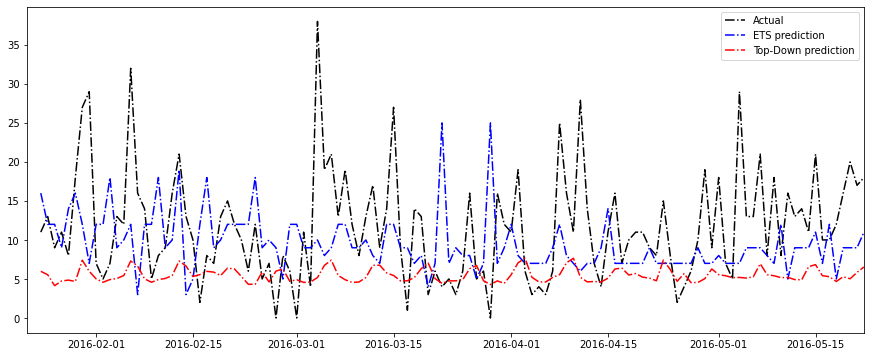

FOODS_1_072
Average sales for foods items is:  7.225
Root mean squared error is:  4.678853135830047
sales fraction is:  0.000165174495543475
(top down) Root mean squared error is:  4.613061686966705
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9859385522577061


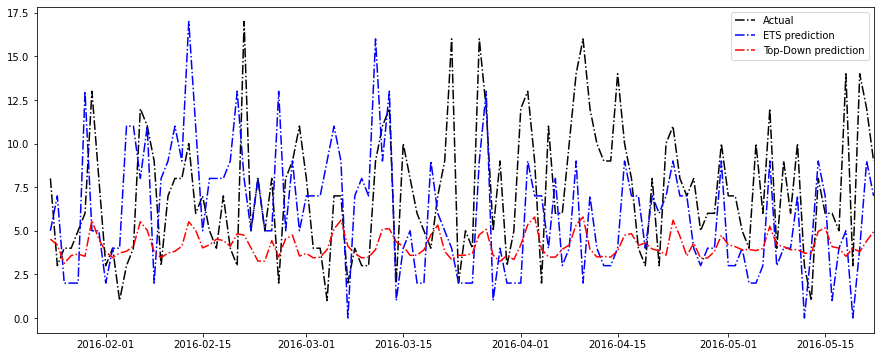

FOODS_1_073
Average sales for foods items is:  6.008333333333334
Root mean squared error is:  3.958114029012639
sales fraction is:  0.0002680087878287279
(top down) Root mean squared error is:  3.3852173192854287
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8552601805991625


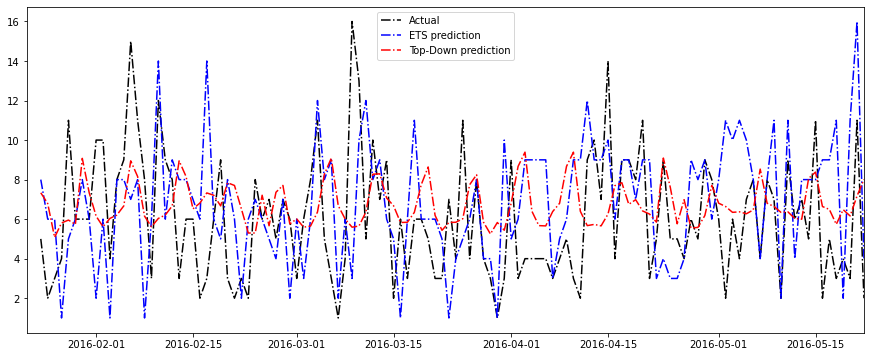

FOODS_1_074
Average sales for foods items is:  10.658333333333333
Root mean squared error is:  6.665208173793223
sales fraction is:  0.00045058492441750063
(top down) Root mean squared error is:  4.049723462897136
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6075914446033582


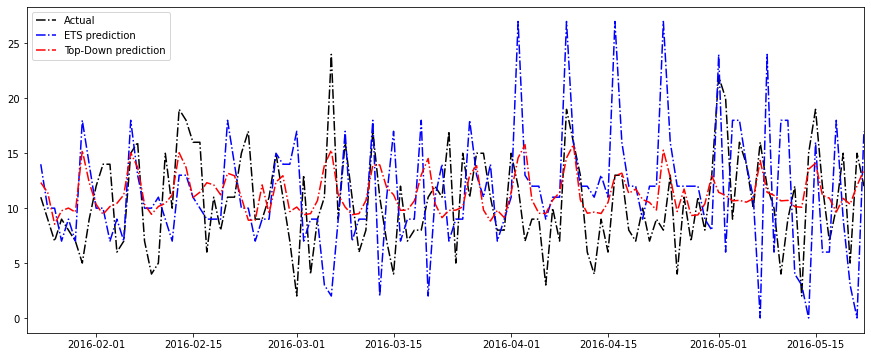

FOODS_1_075
Average sales for foods items is:  4.25
Root mean squared error is:  4.16132991562393
sales fraction is:  0.0002424001566147694
(top down) Root mean squared error is:  3.25501459676894
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7822053676993546


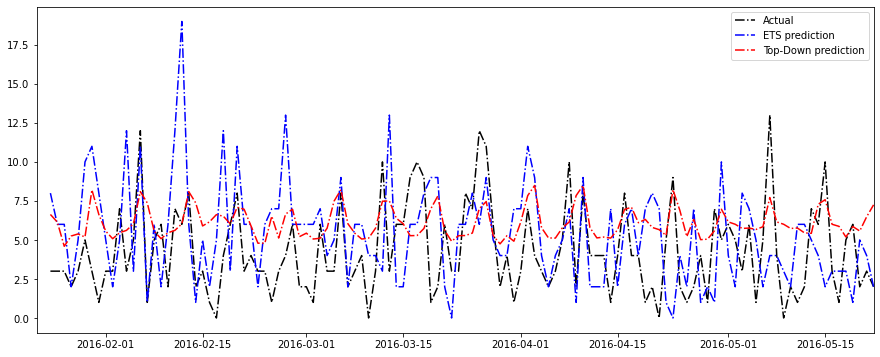

FOODS_1_076
Average sales for foods items is:  10.083333333333334
Root mean squared error is:  5.129977257909305
sales fraction is:  0.00031148937471083
(top down) Root mean squared error is:  4.667086219723838
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9097674287986773


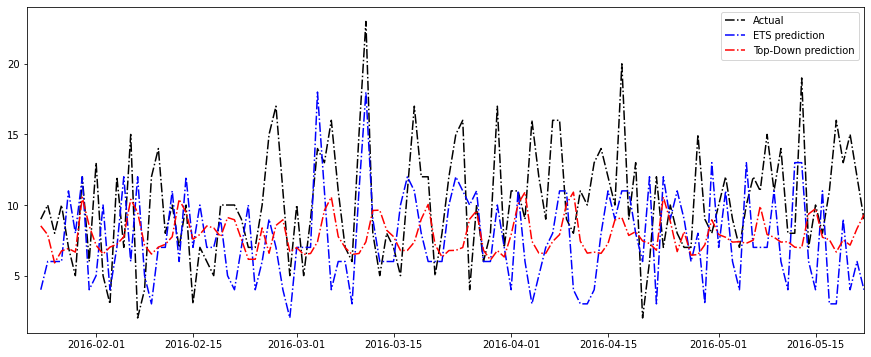

FOODS_1_077
Average sales for foods items is:  2.2333333333333334
Root mean squared error is:  2.2711964541477547
sales fraction is:  5.871878066230881e-05
(top down) Root mean squared error is:  1.7695761124789515
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.779138286011004


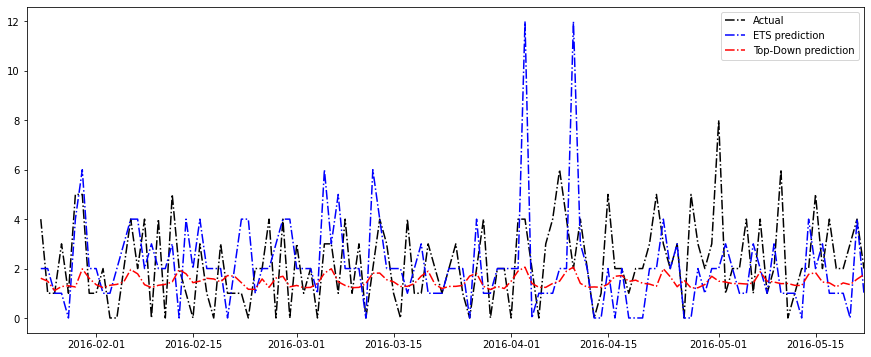

FOODS_1_078
Average sales for foods items is:  6.033333333333333
Root mean squared error is:  4.128155358833612
sales fraction is:  0.00010358679568180628
(top down) Root mean squared error is:  4.680031856274671
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1336859806548047


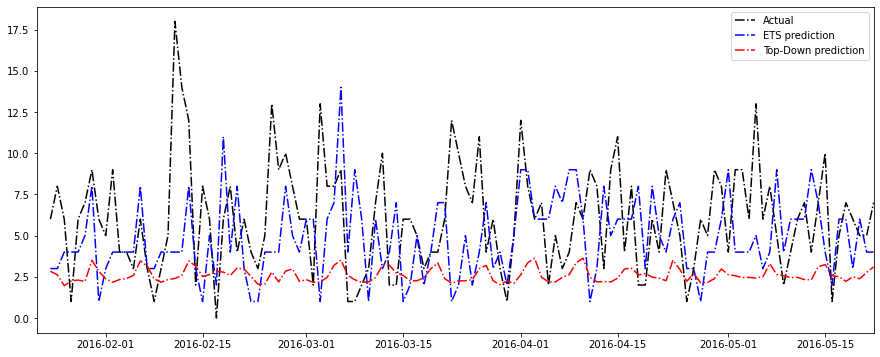

FOODS_1_079
Average sales for foods items is:  1.3833333333333333
Root mean squared error is:  2.0676073128135335
sales fraction is:  3.6872666431117426e-05
(top down) Root mean squared error is:  1.7408017013341275
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8419401936460075


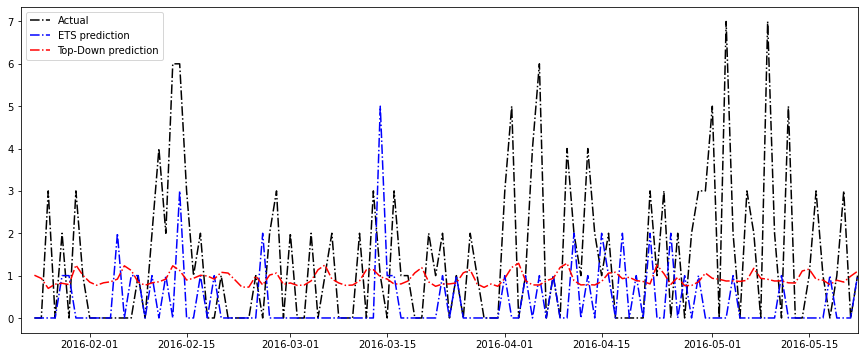

FOODS_1_080
Average sales for foods items is:  6.35
Root mean squared error is:  4.622409184253019
sales fraction is:  0.00023901389133027903
(top down) Root mean squared error is:  3.5101239825928188
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7593711077224883


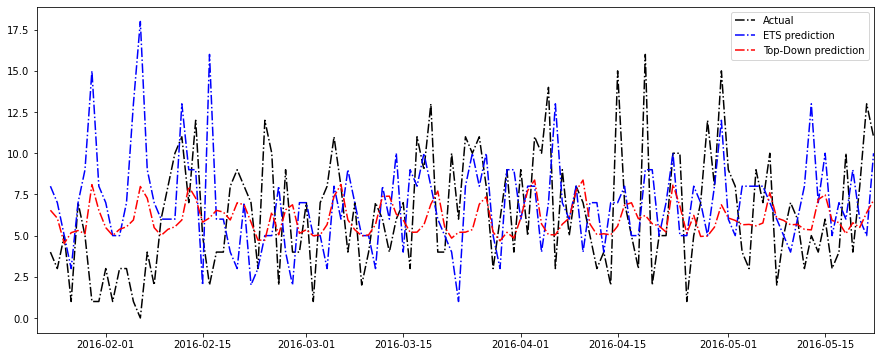

FOODS_1_081
Average sales for foods items is:  8.866666666666667
Root mean squared error is:  5.389032071408248
sales fraction is:  0.00030765631053463605
(top down) Root mean squared error is:  5.214456574726025
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9676054077301858


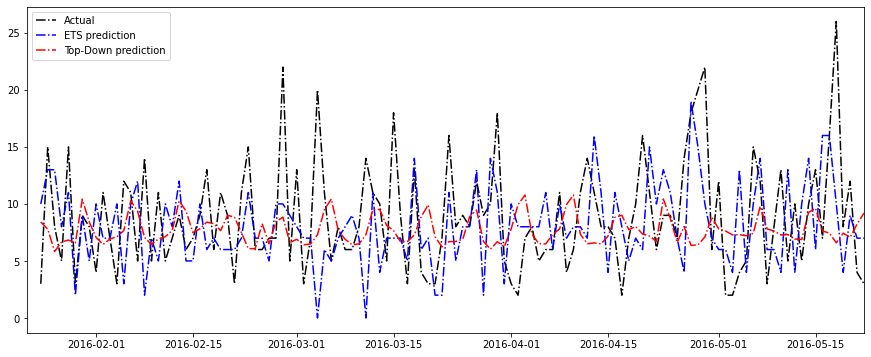

FOODS_1_082
Average sales for foods items is:  59.68333333333333
Root mean squared error is:  21.822580049114265
sales fraction is:  0.0014626314455884195
(top down) Root mean squared error is:  31.051352790178747
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.4229001667215357


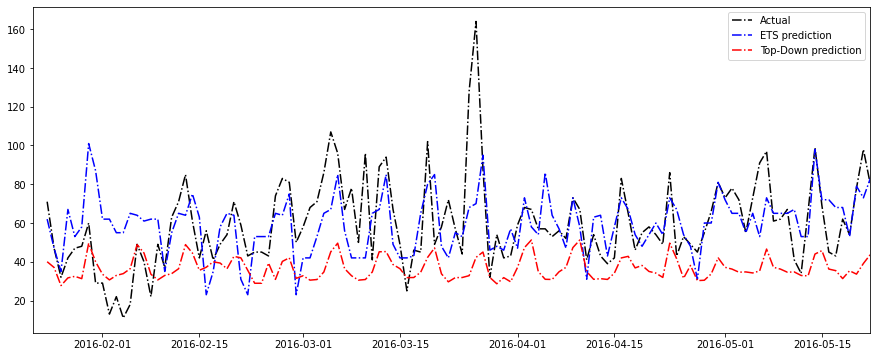

FOODS_1_083
Average sales for foods items is:  18.258333333333333
Root mean squared error is:  12.151817422372122
sales fraction is:  0.0007790056255507825
(top down) Root mean squared error is:  9.679316600092426
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7965324250405791


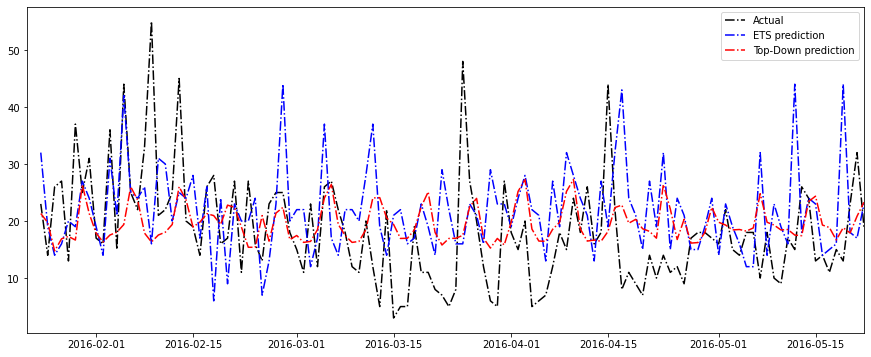

FOODS_1_084
Average sales for foods items is:  3.9916666666666667
Root mean squared error is:  4.475861183429769
sales fraction is:  3.9600491243623566e-05
(top down) Root mean squared error is:  4.218594955295411
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9425214014485543


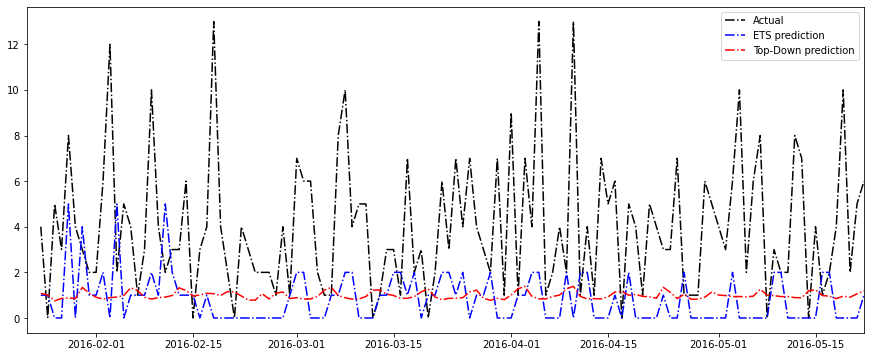

FOODS_1_085
Average sales for foods items is:  89.89166666666667
Root mean squared error is:  28.87343069328617
sales fraction is:  0.003300668023132425
(top down) Root mean squared error is:  23.35446613594681
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8088566400035496


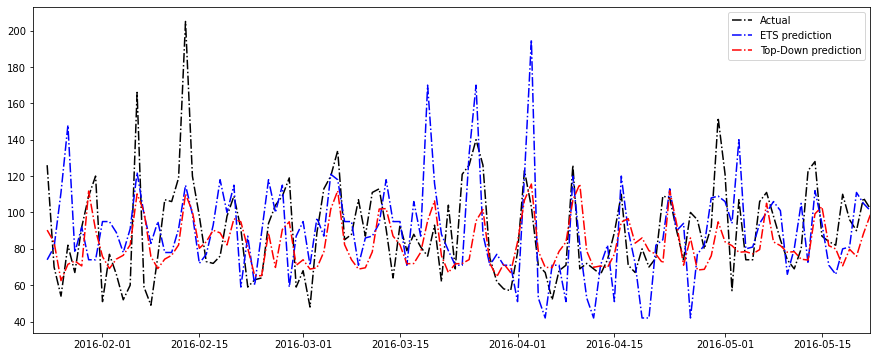

FOODS_1_086
Average sales for foods items is:  19.125
Root mean squared error is:  11.063453348751466
sales fraction is:  0.0010930346992249803
(top down) Root mean squared error is:  13.034804433457333
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1781858722193952


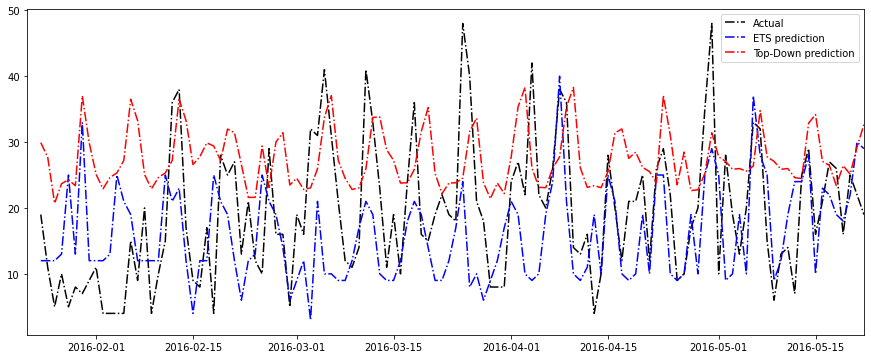

FOODS_1_087
Average sales for foods items is:  30.25
Root mean squared error is:  10.670442040203083
sales fraction is:  0.000853197757304721
(top down) Root mean squared error is:  12.117726600849652
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1356349207646343


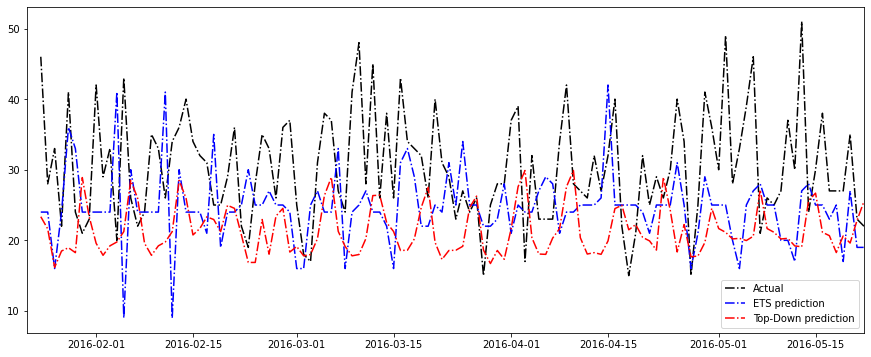

FOODS_1_088
Average sales for foods items is:  17.141666666666666
Root mean squared error is:  12.506664889836404
sales fraction is:  0.0006564416348371448
(top down) Root mean squared error is:  9.965752273162432
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7968353162849309


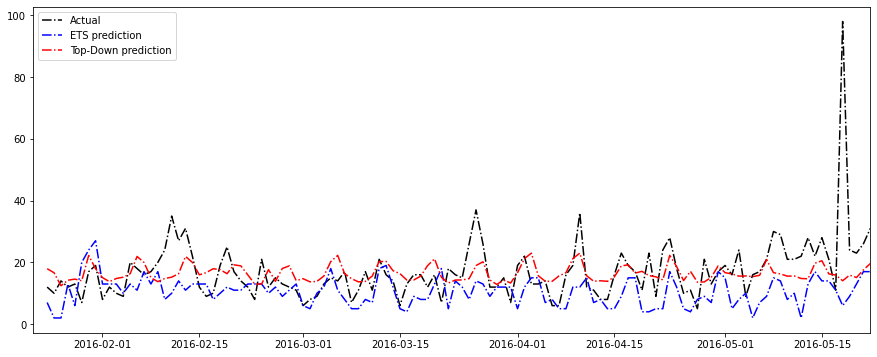

FOODS_1_089
Average sales for foods items is:  5.283333333333333
Root mean squared error is:  3.892300091205713
sales fraction is:  5.9635894176858284e-05
(top down) Root mean squared error is:  4.841092525275795
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.2437613780637802


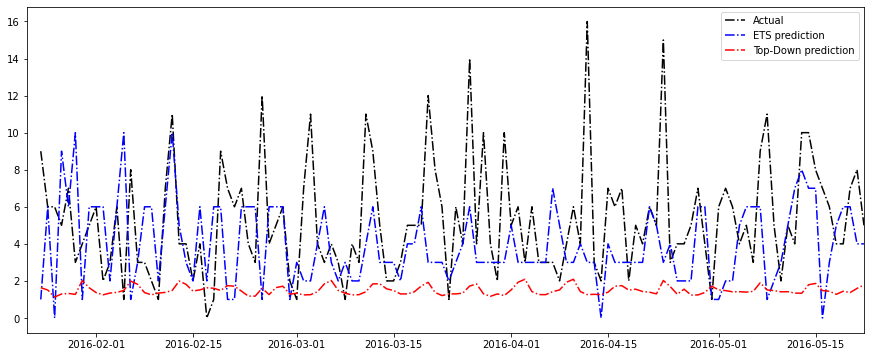

FOODS_1_090
Average sales for foods items is:  9.066666666666666
Root mean squared error is:  6.604922406811453
sales fraction is:  0.0002748283498599932
(top down) Root mean squared error is:  4.696155551224821
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7110084361296691


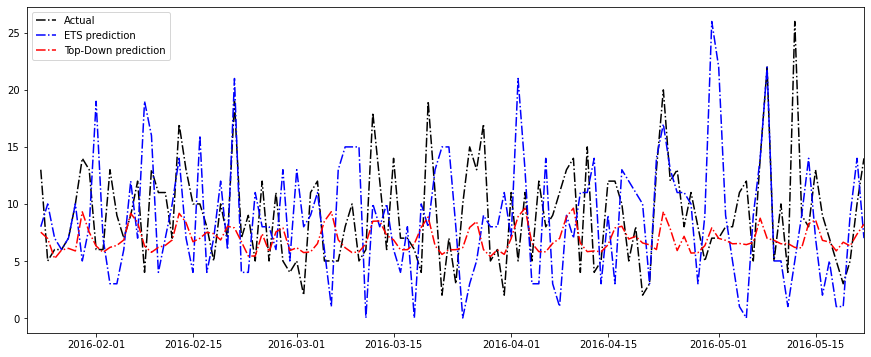

FOODS_1_091
Average sales for foods items is:  2.975
Root mean squared error is:  8.505390447631823
sales fraction is:  0.00027473428693542405
(top down) Root mean squared error is:  6.3288406202055345
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7440976001245997


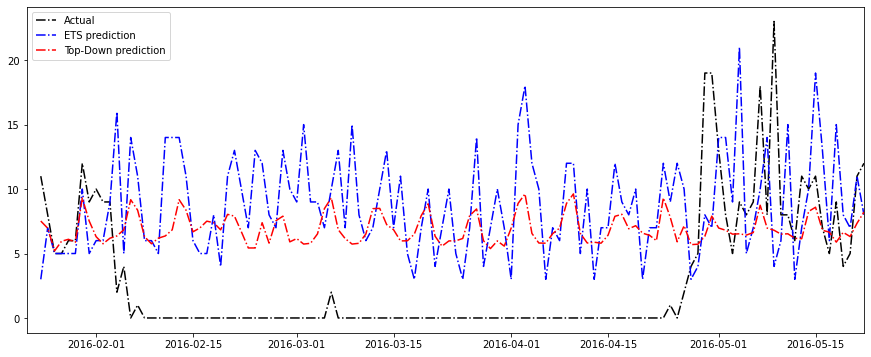

FOODS_1_092
Average sales for foods items is:  12.066666666666666
Root mean squared error is:  7.48108726500812
sales fraction is:  0.0004957351282107057
(top down) Root mean squared error is:  4.996418803834499
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6678733487316266


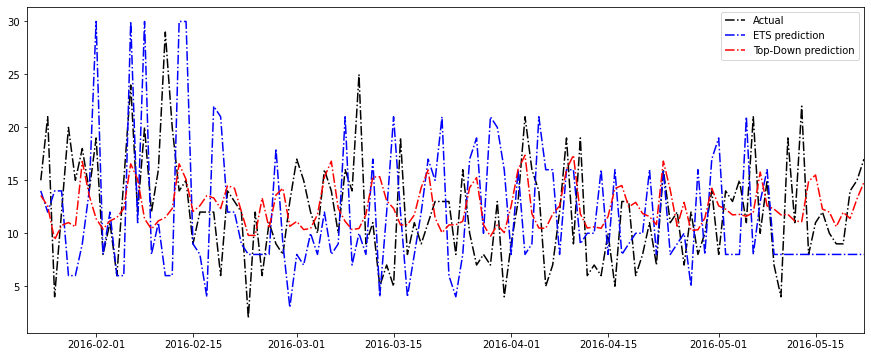

FOODS_1_093
Average sales for foods items is:  4.366666666666666
Root mean squared error is:  3.5154421248732475
sales fraction is:  0.00012635002342754716
(top down) Root mean squared error is:  2.8699745282697346
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8163907771268498


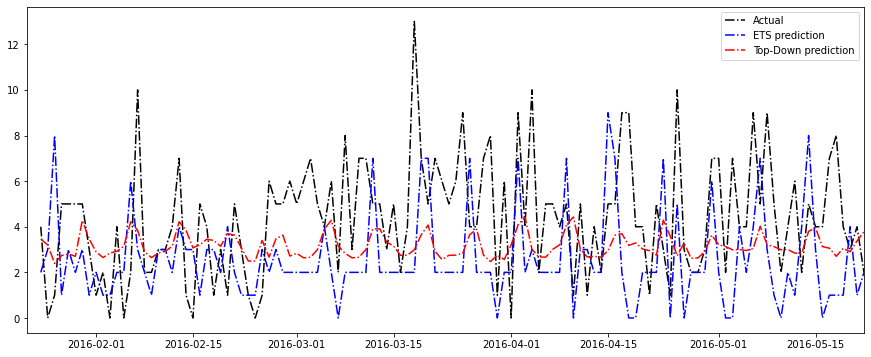

FOODS_1_094
Average sales for foods items is:  11.933333333333334
Root mean squared error is:  7.5603130446651035
sales fraction is:  0.0004158286737891897
(top down) Root mean squared error is:  6.067901482006155
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8025992371159735


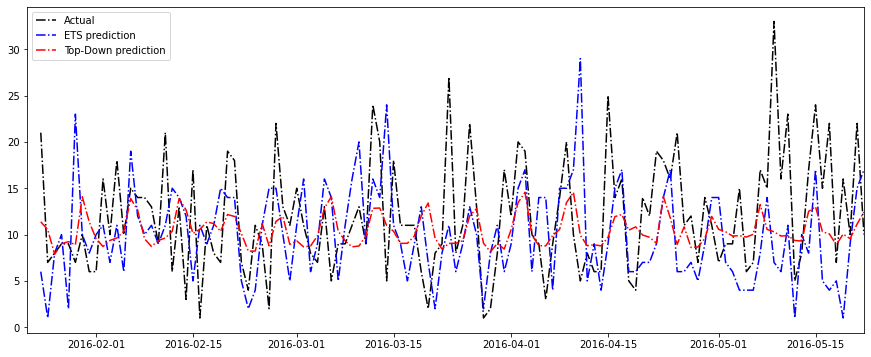

FOODS_1_095
Average sales for foods items is:  4.0
Root mean squared error is:  4.252450274057691
sales fraction is:  0.0001745337565381081
(top down) Root mean squared error is:  3.020807225477321
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7103686182777782


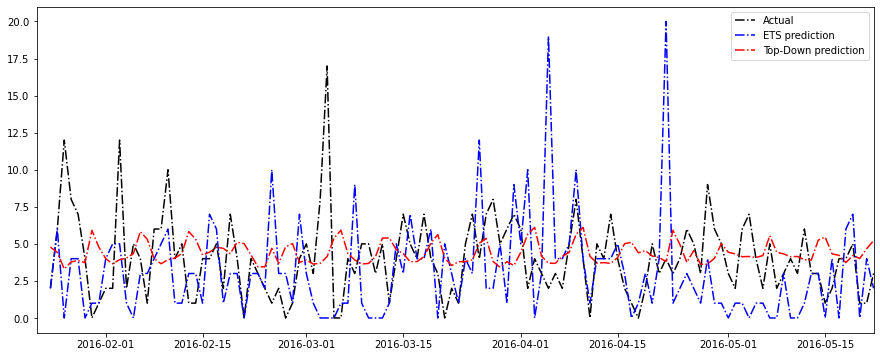

FOODS_1_096
Average sales for foods items is:  132.725
Root mean squared error is:  56.63082199650646
sales fraction is:  0.0018831397498749256
(top down) Root mean squared error is:  90.2124887395514
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.5929927477499193


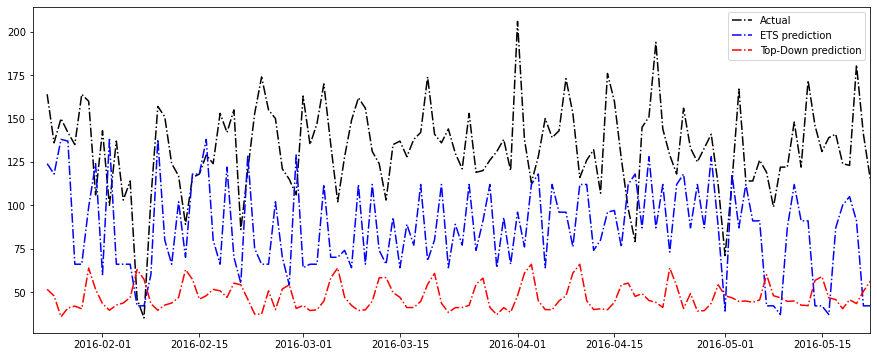

FOODS_1_097
Average sales for foods items is:  22.058333333333334
Root mean squared error is:  11.043851985003542
sales fraction is:  0.0005538424998633148
(top down) Root mean squared error is:  11.86231682418445
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0741104498948648


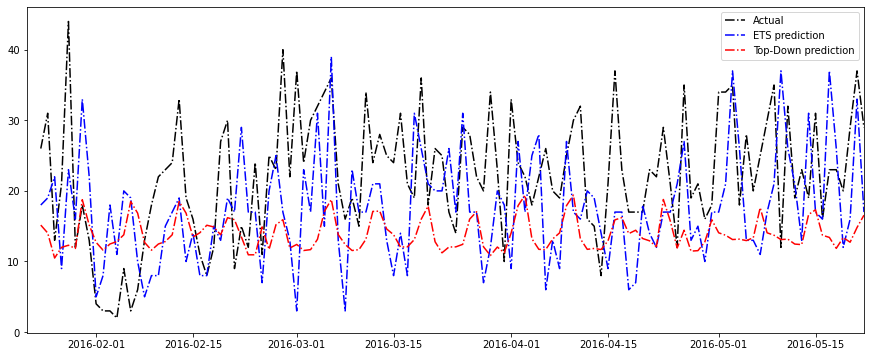

FOODS_1_098
Average sales for foods items is:  10.391666666666667
Root mean squared error is:  7.73789377027108
sales fraction is:  0.00011470973651211149
(top down) Root mean squared error is:  9.11067830238538
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1774106201080876


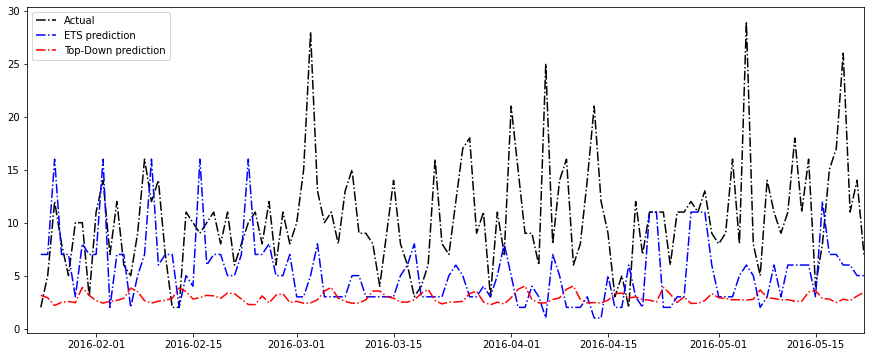

FOODS_1_099
Average sales for foods items is:  68.475
Root mean squared error is:  22.943771849167838
sales fraction is:  0.0013507200810822409
(top down) Root mean squared error is:  38.48445980437998
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.677337974652838


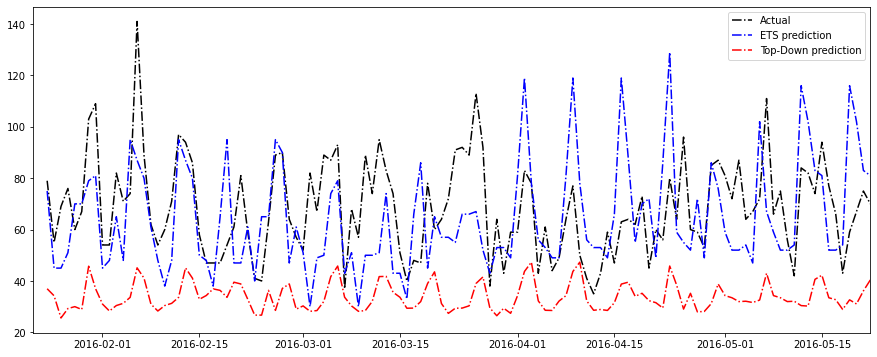

FOODS_1_101
Average sales for foods items is:  7.191666666666666
Root mean squared error is:  4.717873814901511
sales fraction is:  0.0002442343836438684
(top down) Root mean squared error is:  4.030616388080759
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8543289935712071


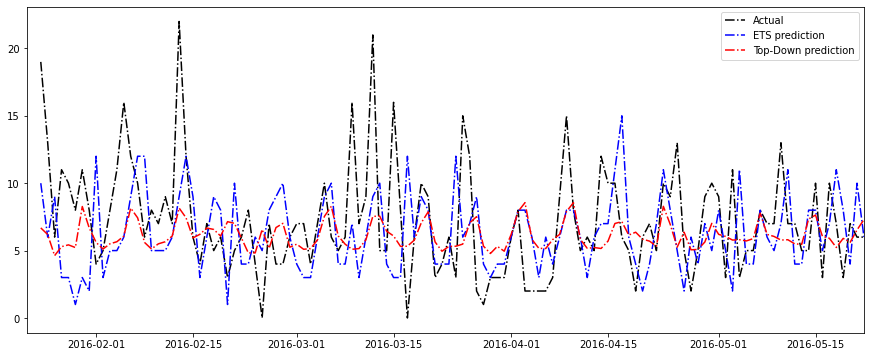

FOODS_1_102
Average sales for foods items is:  7.683333333333334
Root mean squared error is:  5.921711464320654
sales fraction is:  0.00028983138632877696
(top down) Root mean squared error is:  4.111007635886633
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6942262656085444


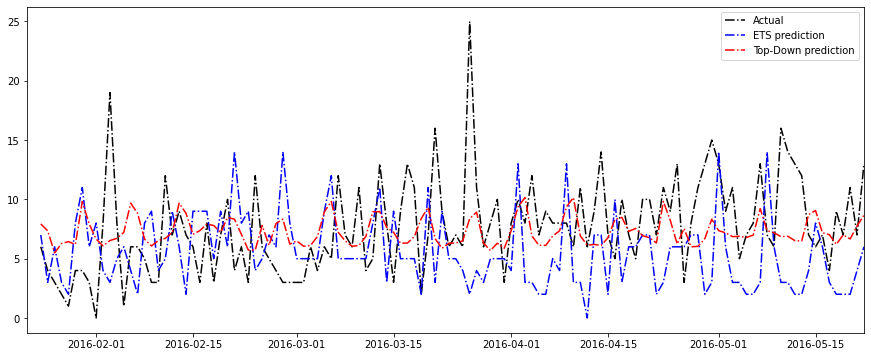

In [192]:
list_of_FOODS_1_items = sales[sales.cat_id == 'FOODS'].item_id[0:100].values

for cat in list_of_FOODS_1_items:
    print(cat)
    topdown_compare_visual(column_to_filter = 'item_id', column_value_to_filter=cat)

In [193]:
ratio = []
for cat in list_of_FOODS_1_items:
    ratio.append(topdown_compare_ratio(column_to_filter = 'item_id', column_value_to_filter=cat))

ratio

[0.7505756214821206,
 0.8503861783062053,
 0.8525621189954714,
 0.7900095091734523,
 0.9565275916041206,
 0.9172122675421784,
 0.6340768116834166,
 0.7551600368023923,
 0.9399325045193954,
 0.8448413403593539,
 1.1585719894509967,
 0.8188302214932942,
 0.9325778646982825,
 0.7635522332048976,
 0.6405476785938212,
 0.8553077299232444,
 1.3151881187672108,
 1.07604571910884,
 0.7169765856689554,
 0.72777226754634,
 0.7733756143836465,
 1.1786409122501469,
 0.7176123864556655,
 0.7858458115805685,
 0.9727300532890313,
 0.8863332559371613,
 0.7656326456492275,
 0.8462903044277013,
 0.797942095979,
 0.8302691124743208,
 0.5739533486584312,
 0.823658534511959,
 0.8299934914712773,
 0.9214936100031494,
 0.6505918173143281,
 0.7814209359216945,
 0.6129064829047264,
 0.8686257546016172,
 0.8362505174657104,
 0.6773286262186524,
 1.002669340884133,
 0.9336533183679026,
 0.8137956014762873,
 0.8489127136755901,
 0.8315305415401819,
 0.7147604294460913,
 0.939801216776498,
 0.7068900828654788,
 0.

(array([10., 25., 32., 15.,  4.,  6.,  3.,  2.,  0.,  3.]),
 array([0.57395335, 0.68140481, 0.78885627, 0.89630772, 1.00375918,
        1.11121064, 1.2186621 , 1.32611356, 1.43356502, 1.54101647,
        1.64846793]),
 <BarContainer object of 10 artists>)

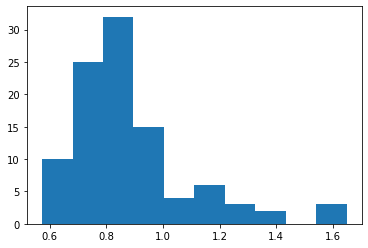

In [194]:
plt.hist(ratio)

In [108]:
len(list_of_FOODS_1_items)

20

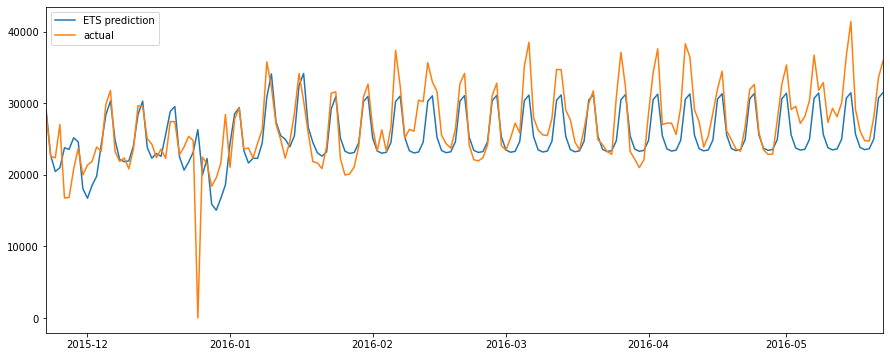

In [33]:
plt.figure(figsize=(15,6))
plt.plot(foods.ETS, label='ETS prediction')
plt.plot(foods.FOODS, label='actual')
plt.xlim('2015-11-22', '2016-05-22')
plt.legend()

Average sales for foods items is:  28314.183333333334
Root mean squared error is:  4134.218426740416


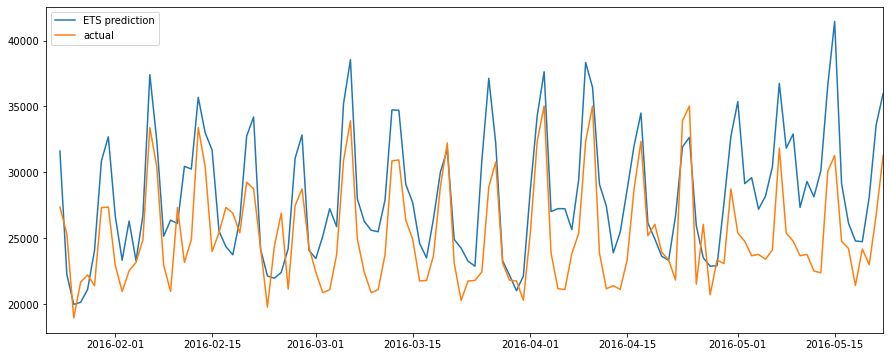

In [38]:
print("Average sales for foods items is: ", foods_y_test.mean())
rmse = sqrt(mean_squared_error(foods_y_test, foods_y_predicted))
print("Root mean squared error is: ", rmse)
plt.figure(figsize=(15,6))
plt.plot(foods_y_test, label='ETS prediction')
plt.plot(foods_y_test.index, foods_y_predicted, label='actual')
plt.xlim('2016-01-22', '2016-05-22')
plt.legend()

Average sales for foods items is:  28314.183333333334
Root mean squared error is:  4137.234799154302


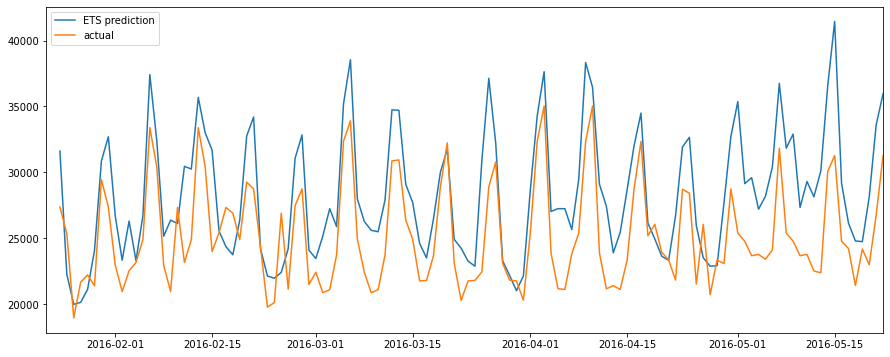

In [77]:
print("Average sales for foods items is: ", foods_y_test.mean())
rmse = sqrt(mean_squared_error(foods_y_test, prediction_for_top_of_chain_sales))
print("Root mean squared error is: ", rmse)
plt.figure(figsize=(15,6))
plt.plot(foods_y_test, label='ETS prediction')
plt.plot(foods_y_test.index, prediction_for_top_of_chain_sales, label='actual')
plt.xlim('2016-01-22', '2016-05-22')
plt.legend()